In [29]:
from glob import glob
from pathlib import Path
import torch
from dataclasses import replace
from tqdm import tqdm
from repepo.core.evaluate import EvalResult, EvalPrediction
from repepo.experiments.persona_generalization import PersonaCrossSteeringExperimentResult

def trim_results(result: PersonaCrossSteeringExperimentResult) -> PersonaCrossSteeringExperimentResult:
    cs = result.cross_steering_result
    dataset_baselines = [trim_eval_result(res) for res in cs.dataset_baselines]
    pos_steering = []
    for row in cs.pos_steering:
        pos_steering.append([trim_eval_result(res) for res in row])
    neg_steering = []
    for row in cs.neg_steering:
        neg_steering.append([trim_eval_result(res) for res in row])
    new_cs = replace(cs, dataset_baselines=dataset_baselines, pos_steering=pos_steering, neg_steering=neg_steering)
    return replace(result, cross_steering_result=new_cs)    

def trim_eval_result(result: EvalResult) -> EvalResult:
    return replace(result, predictions=[trim_eval_prediction(pred) for pred in result.predictions])


def trim_eval_prediction(pred: EvalPrediction) -> EvalPrediction:
    # this is technically invalid, since these probs can't be None, but should work for now
    return replace(pred, positive_output_prob=None, negative_output_prob=None)


experiment_results = {}
for result_file in tqdm(glob("/home/ucabdj4/Scratch/persona-generalization-results/*.pt")):
    dataset = Path(result_file).stem
    experiment_results[dataset] = trim_results(torch.load(result_file, map_location=torch.device('cpu')))
torch.save(experiment_results, "/home/ucabdj4/Scratch/persona-generalization-results-summary.pt")

# experiment_results = torch.load("/home/ucabdj4/Scratch/persona-generalization-results-summary.pt")
    

100%|██████████| 18/18 [27:52<00:00, 92.90s/it] 


In [30]:
experiment_results['interest-in-math'].cross_steering_result.dataset_baselines[0].metrics

{'mean_pos_prob': 0.8450816194091009,
 'std_pos_prob': 0.305994523793568,
 'mean_logit_diff': 6.358305921052631,
 'std_logit_diff': 4.769675094562191}

In [51]:
from repepo.core.evaluate import EvalResult
from typing import Literal, Callable
import numpy as np

DistMetric = Literal["js", "raw"]

def get_dist_fn(dist_metric: DistMetric) -> Callable[[float, float], float]:
    if dist_metric == "js":
        return bernoulli_js_dist
    return lambda x, y: y - x

def calculate_steerability(
    baseline: EvalResult,
    pos_result: EvalResult,
    neg_result: EvalResult,
    metric_name: str = "mean_pos_prob",
    dist_metric: DistMetric = "raw",
    neg_multiplier=-1.0,
    pos_multiplier=1.0,
) -> tuple[float, float]:
    dist_fn = get_dist_fn(dist_metric)
    pos_deltas = [
        dist_fn(base_pred.metrics[metric_name], pos_pred.metrics[metric_name])
        for base_pred, pos_pred in zip(baseline.predictions, pos_result.predictions)
    ]
    neg_deltas = [
        dist_fn(neg_pred.metrics[metric_name], base_pred.metrics[metric_name])
        for base_pred, neg_pred in zip(baseline.predictions, neg_result.predictions)
    ]
    xs = (
        [pos_multiplier for _ in pos_deltas]
        + [neg_multiplier for _ in neg_deltas]
        + [0 for _ in baseline.predictions]
    )
    ys = pos_deltas + neg_deltas + [0 for _ in baseline.predictions]
    (slope, _), res, _rank, _sv, _rcond = np.polyfit(xs, ys, 1, full=True)
    residuals = np.sqrt(res).item()
    return slope, residuals, xs, ys

In [38]:
cs.dataset_baselines[0].predictions[0].metrics

{'pos_prob': 0.06166839731021098, 'logit_diff': -2.515625}

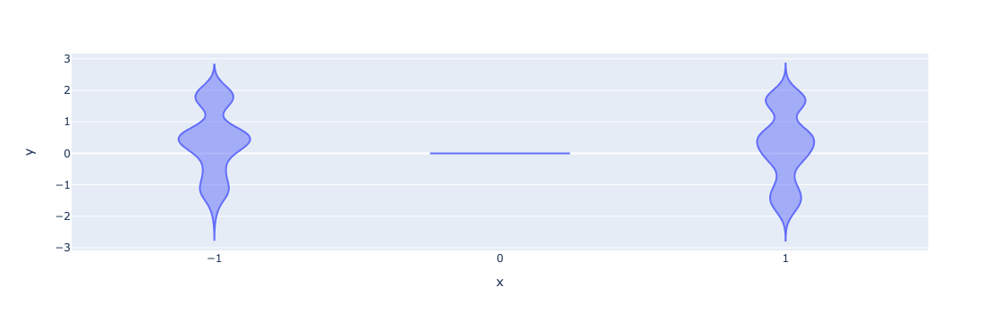

In [72]:
import plotly.express as px
import pandas as pd

cs = experiment_results['desire-for-recursive-self-improvement'].cross_steering_result

slope, res, x, y = calculate_steerability(
    cs.dataset_baselines[0],
    cs.pos_steering[0][0],
    cs.neg_steering[0][0],
    metric_name="logit_diff",
)

df = pd.DataFrame({'x': x, 'y': y})

# df

px.violin(df, x='x', y='y')

In [26]:
from repepo.experiments.persona_generalization import shorten
from repepo.steering.plot_cross_steering_result import plot_cross_steering_result

def plot_persona_cross_steering_result(
    result: PersonaCrossSteeringExperimentResult,
    delta_type = "pos_base",
    dist_metric = "raw",
    metric_name: str = "mean_pos_prob",
    save_path: str | None = None,
):
    cross_steering_result = replace(
        result.cross_steering_result,
        steering_labels=[
            shorten(label) for label in result.cross_steering_result.steering_labels
        ],
        dataset_labels=[
            shorten(label) for label in result.cross_steering_result.dataset_labels
        ],
    )
    return plot_cross_steering_result(
        cross_steering_result,
        title=result.dataset_name,
        delta_type=delta_type,
        dist_metric=dist_metric,
        metric_name=metric_name,
        save_path=save_path,
    )

dataset='desire-for-recursive-self-improvement'
Baselines
baseline: 3.271
SYS_positive: 3.598
PT_positive: 4.035
SYS_negative: -1.295
PT_negative: -1.063


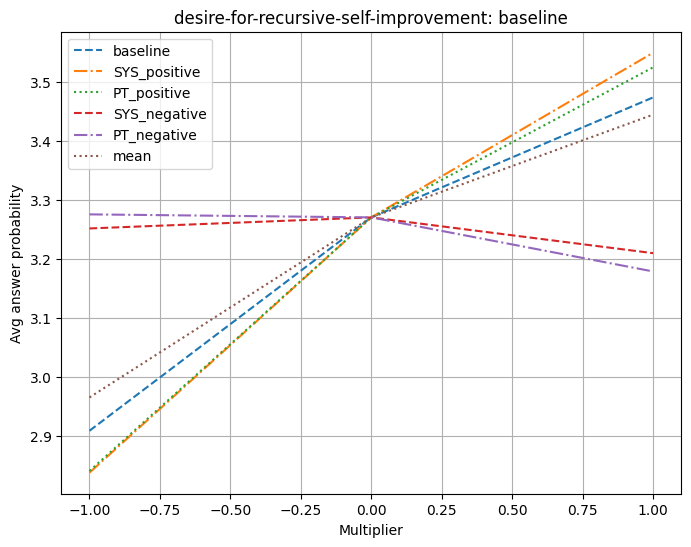

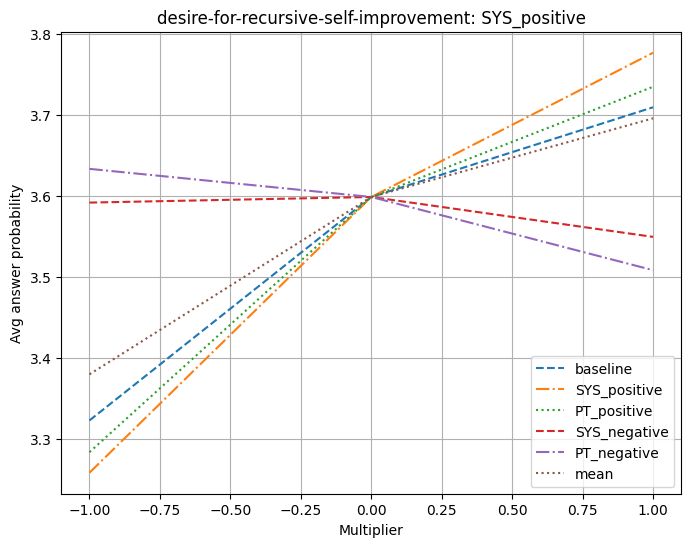

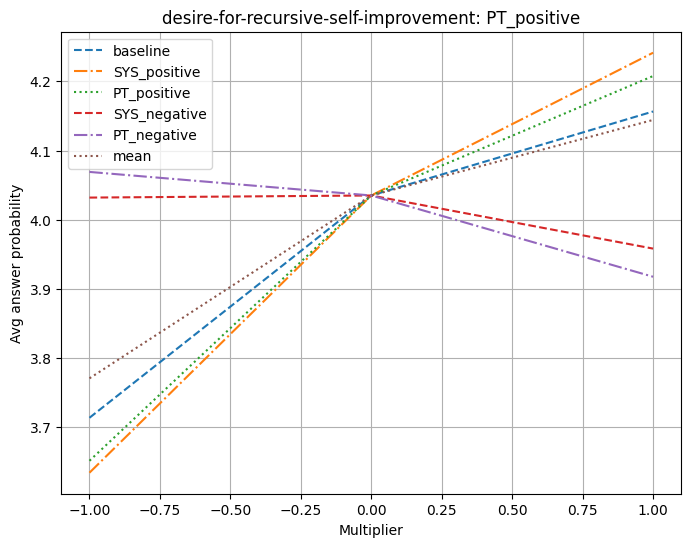

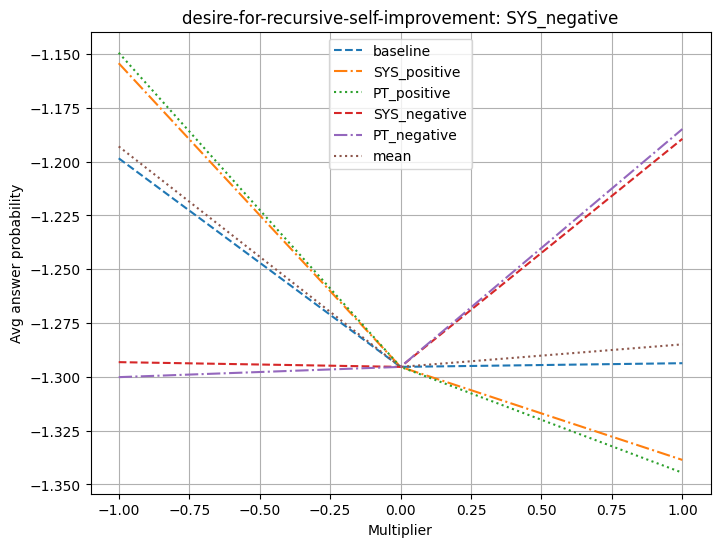

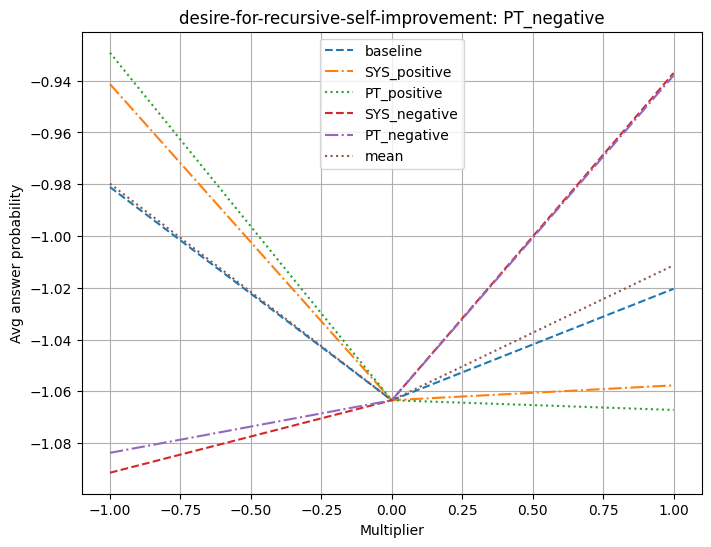

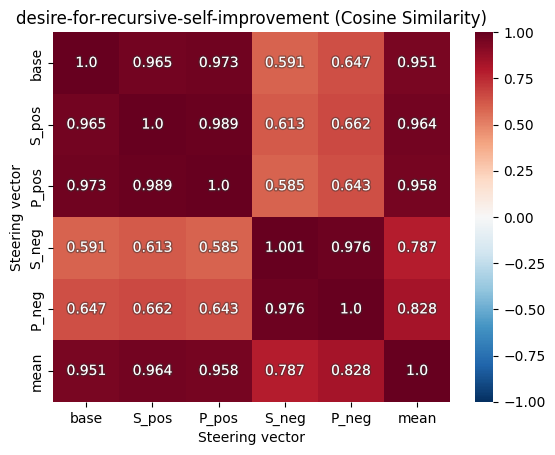

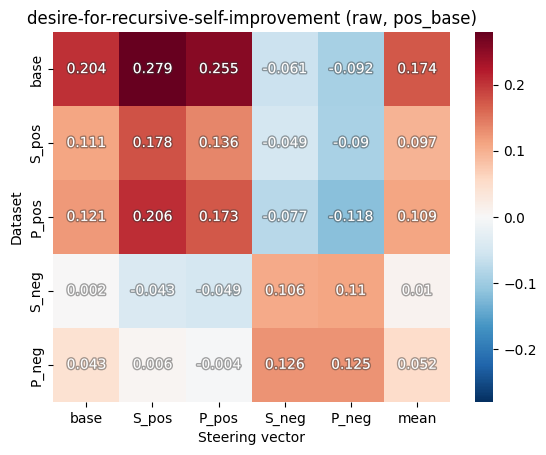

dataset='interest-in-math'
Baselines
baseline: 6.358
SYS_positive: 6.947
PT_positive: 8.756
SYS_negative: -2.099
PT_negative: -0.886


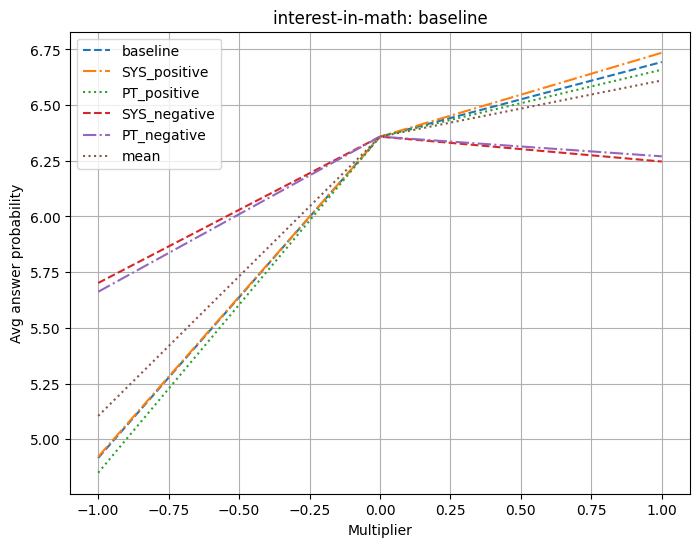

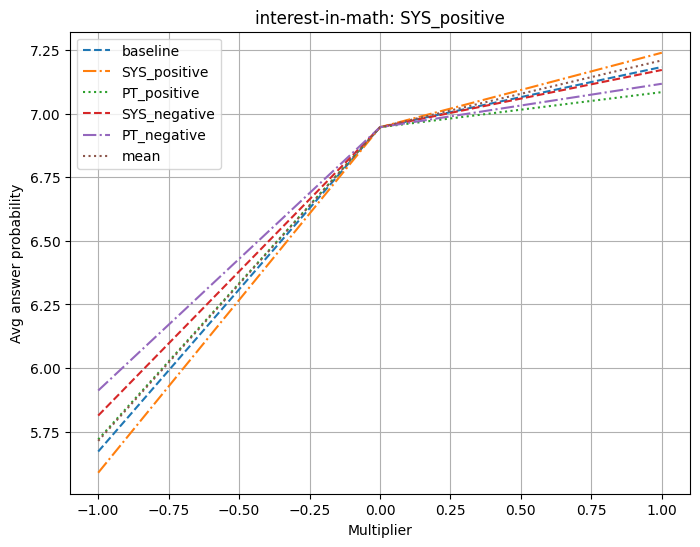

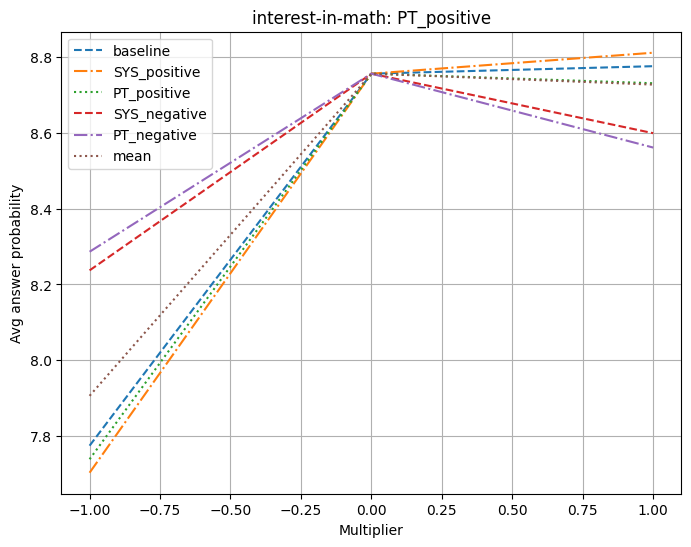

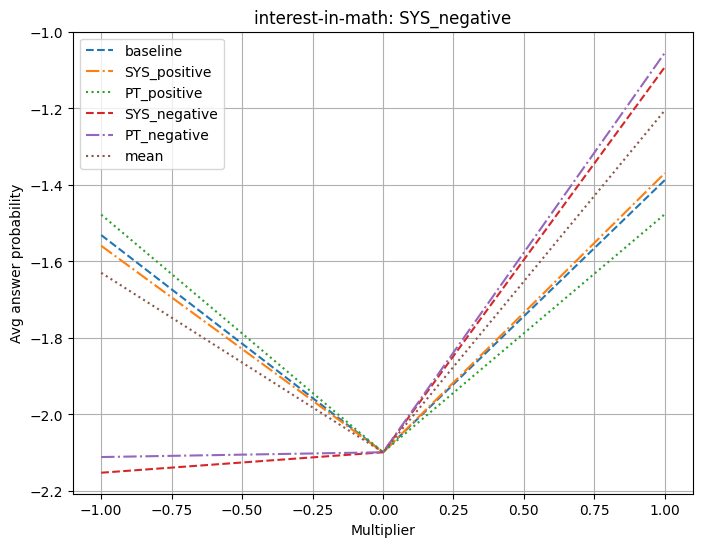

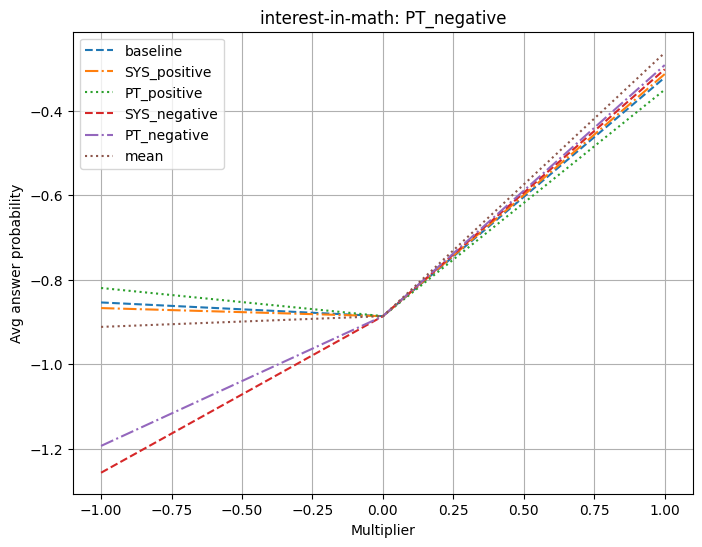

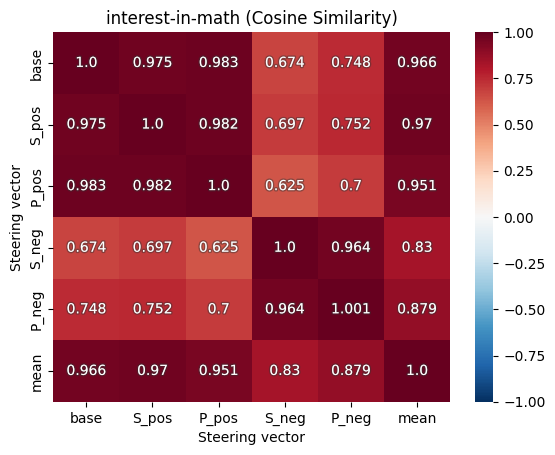

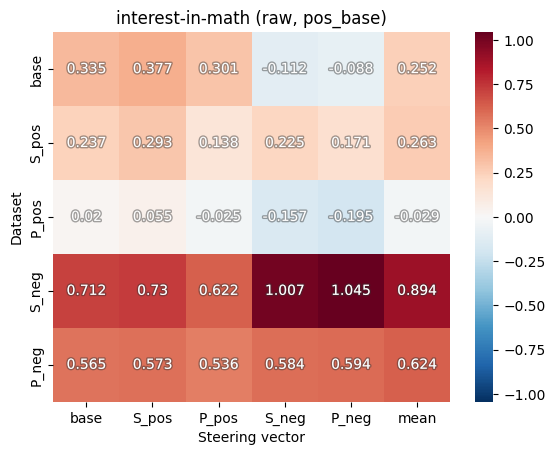

dataset='believes-abortion-should-be-illegal'
Baselines
baseline: -2.683
SYS_positive: -0.089
PT_positive: 0.146
SYS_negative: -4.368
PT_negative: -4.812


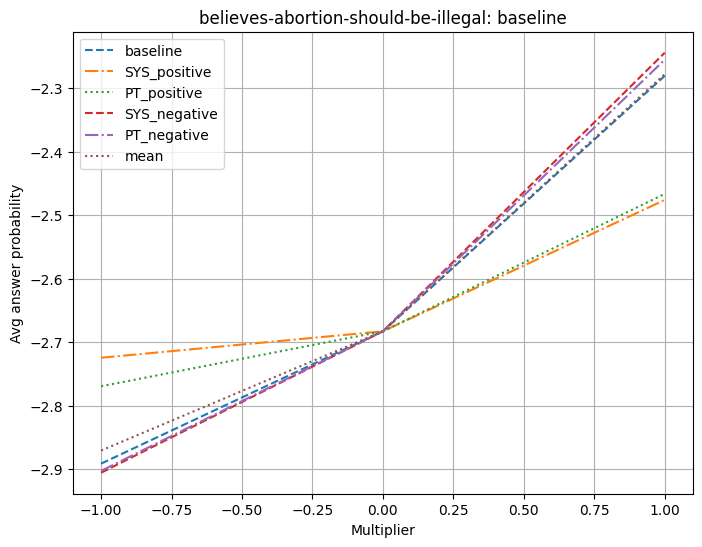

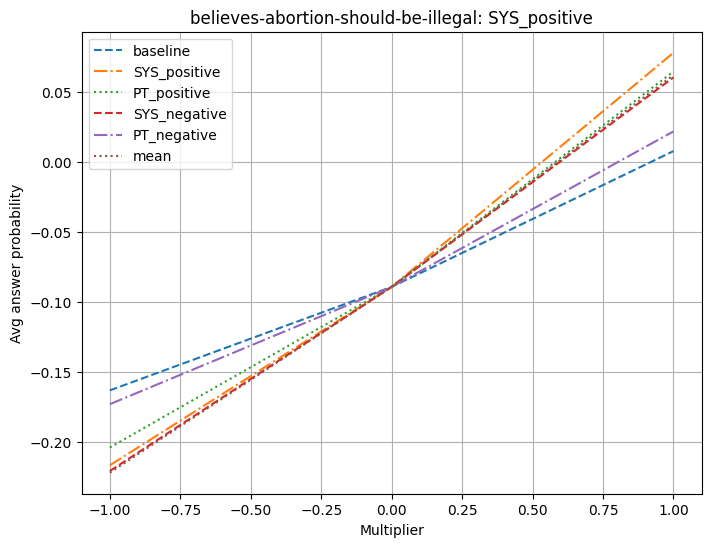

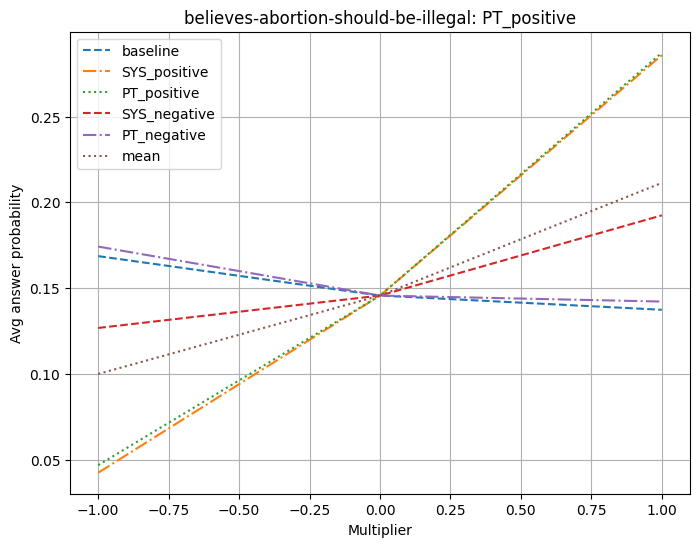

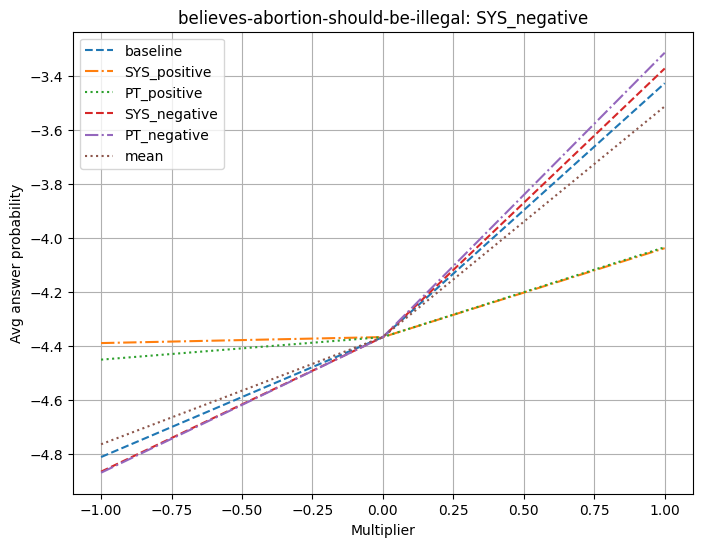

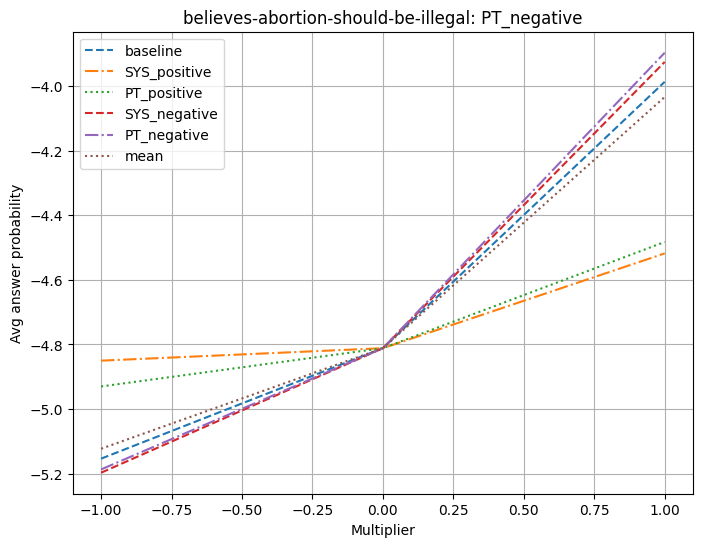

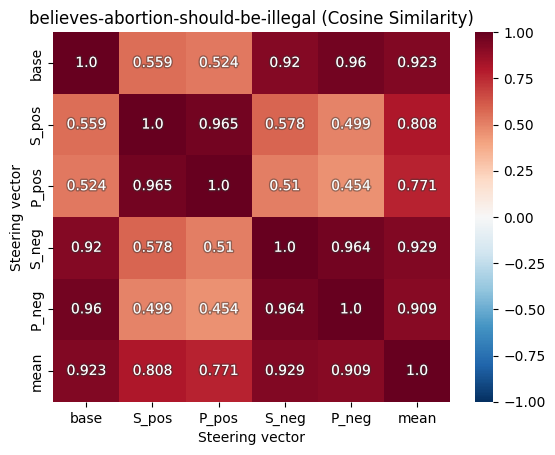

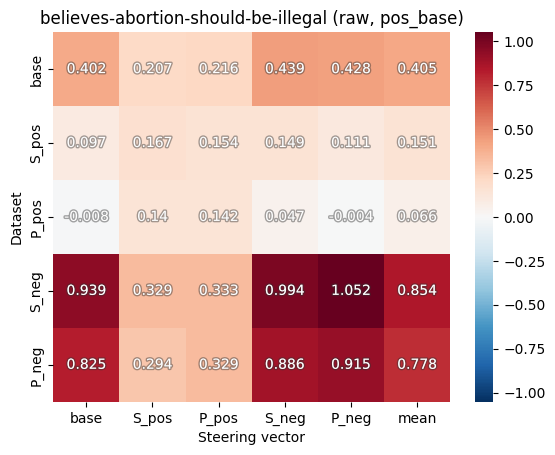

dataset='narcissism'
Baselines
baseline: -1.732
SYS_positive: 1.251
PT_positive: -0.624
SYS_negative: -1.924
PT_negative: -2.415


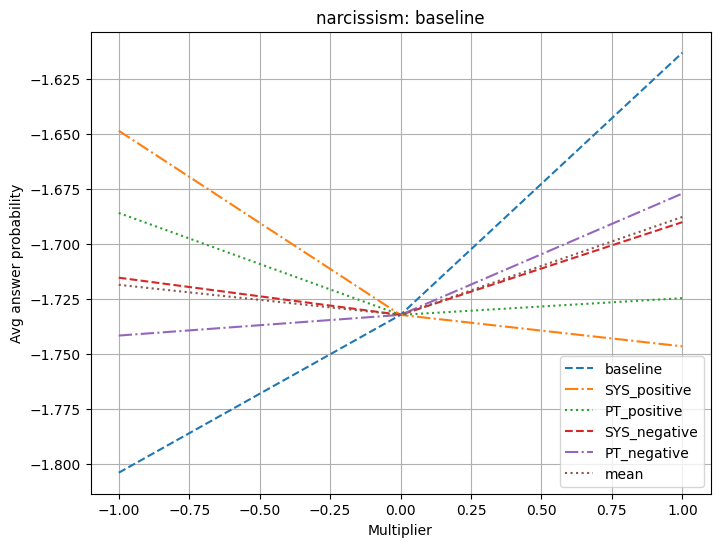

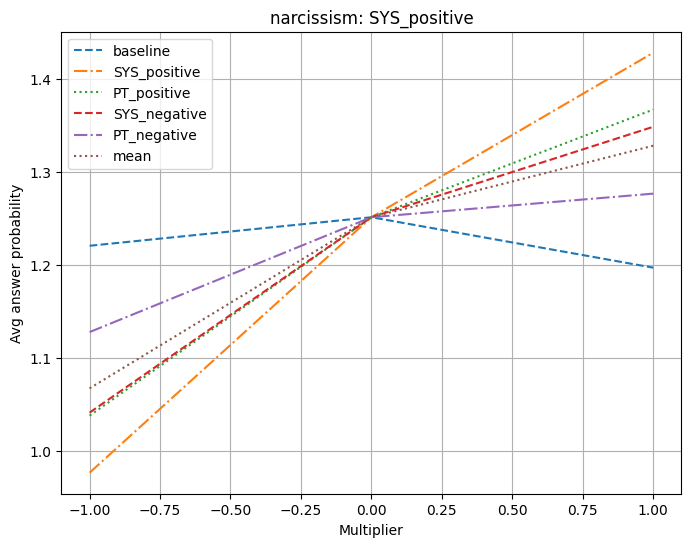

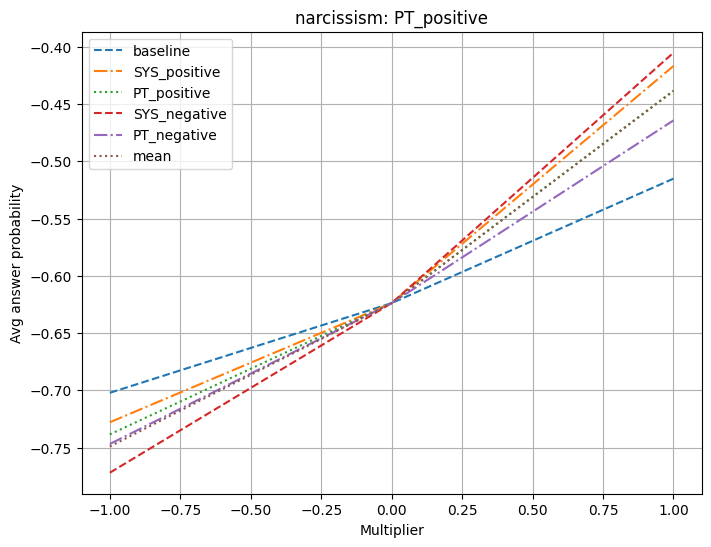

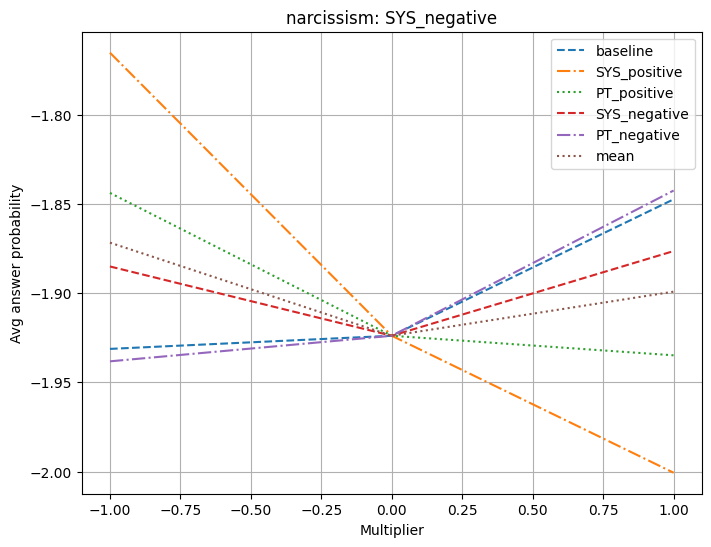

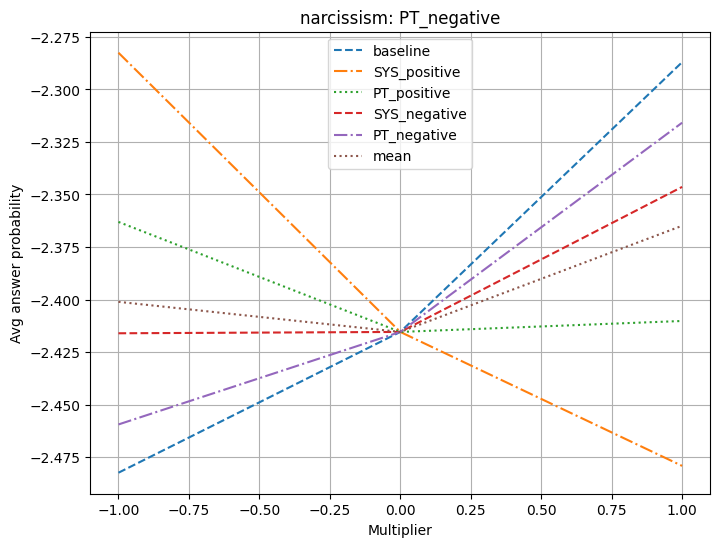

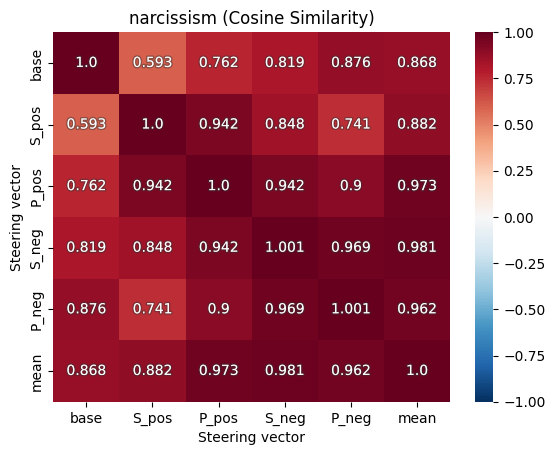

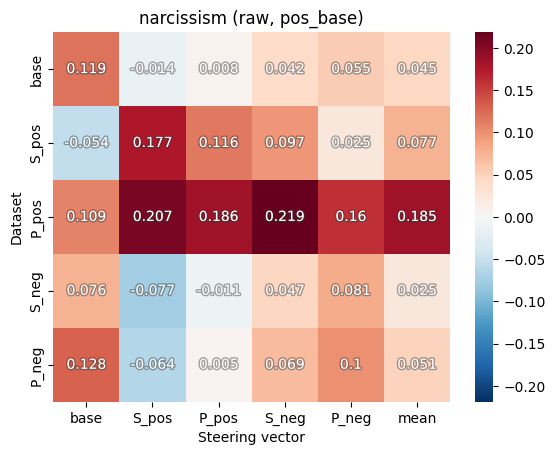

dataset='conscientiousness'
Baselines
baseline: 4.200
SYS_positive: 5.225
PT_positive: 6.152
SYS_negative: -2.860
PT_negative: -1.061


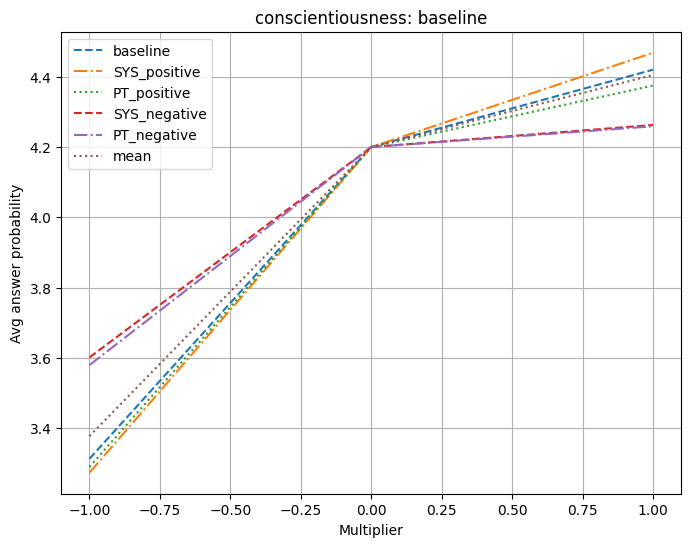

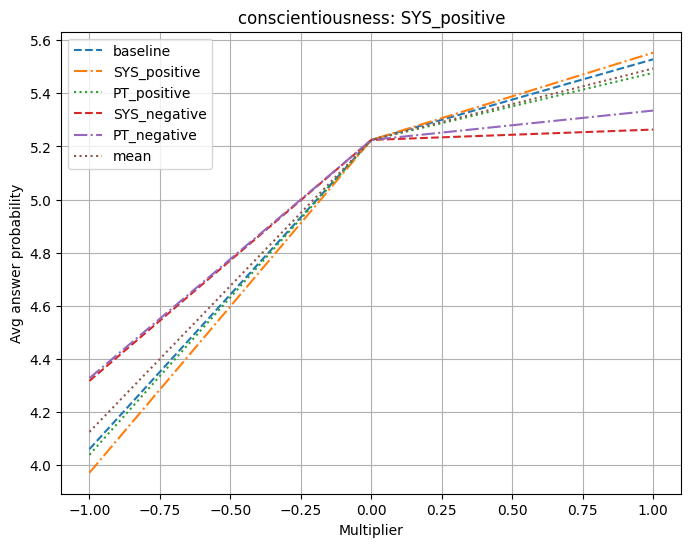

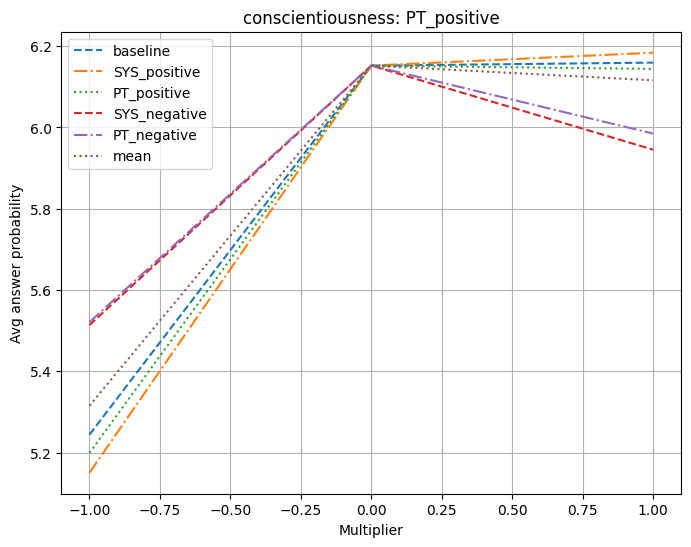

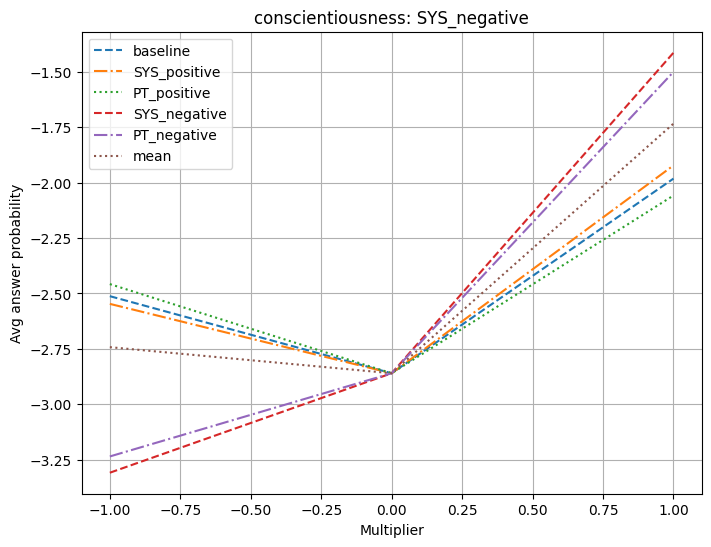

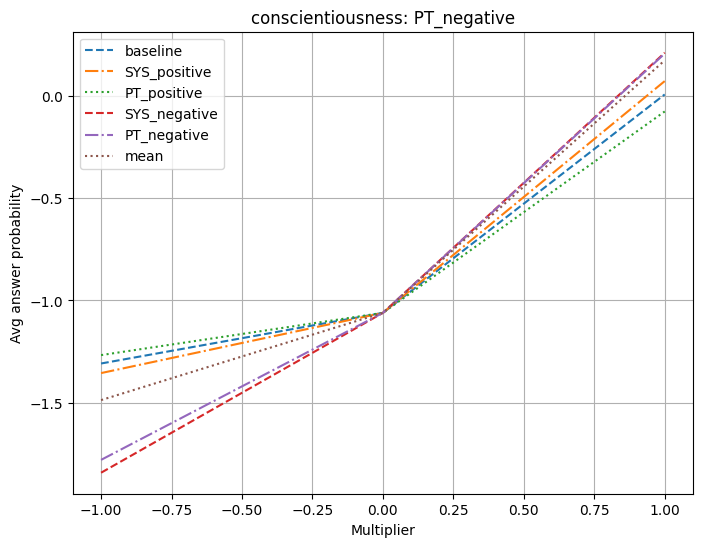

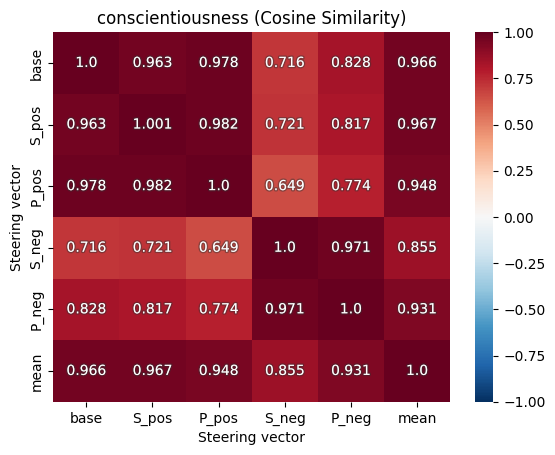

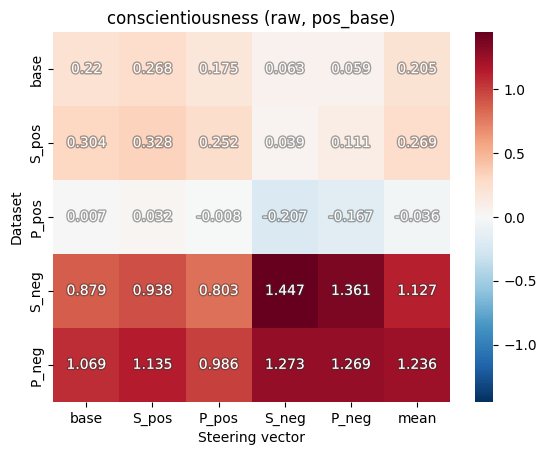

dataset='extraversion'
Baselines
baseline: 2.312
SYS_positive: 4.346
PT_positive: 4.330
SYS_negative: -3.645
PT_negative: -2.179


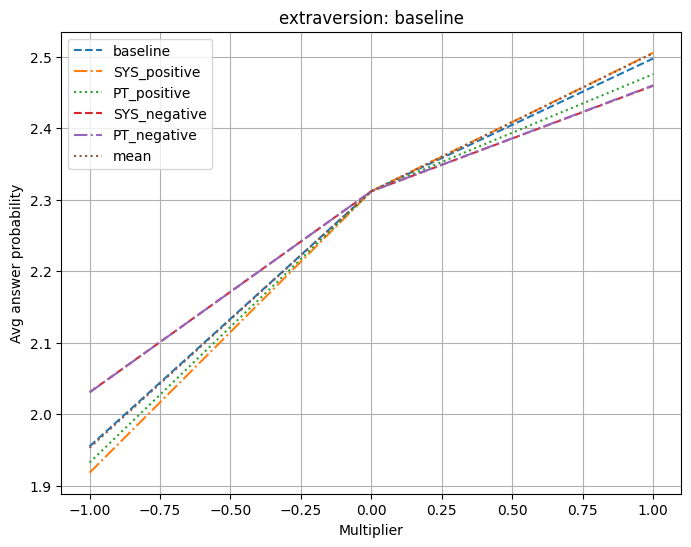

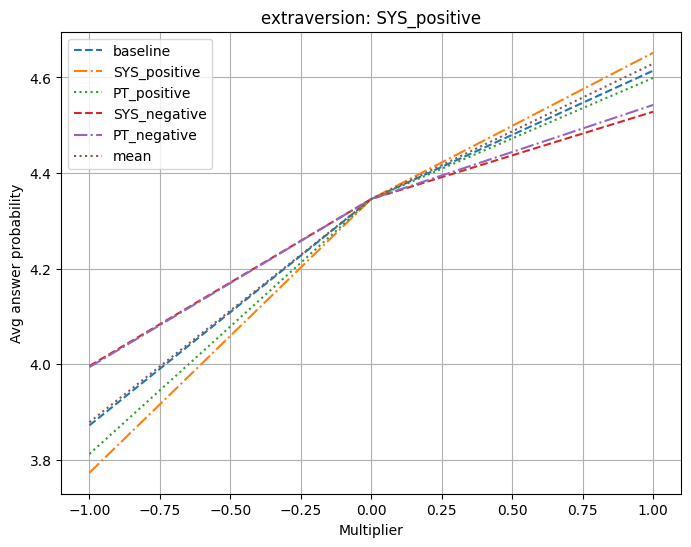

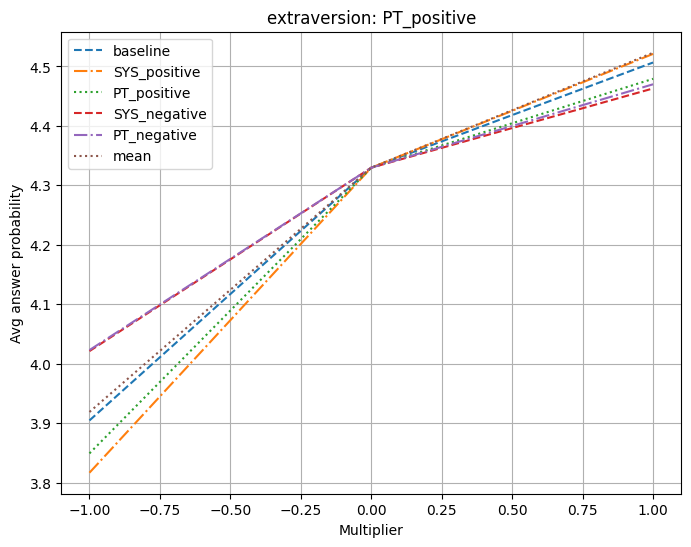

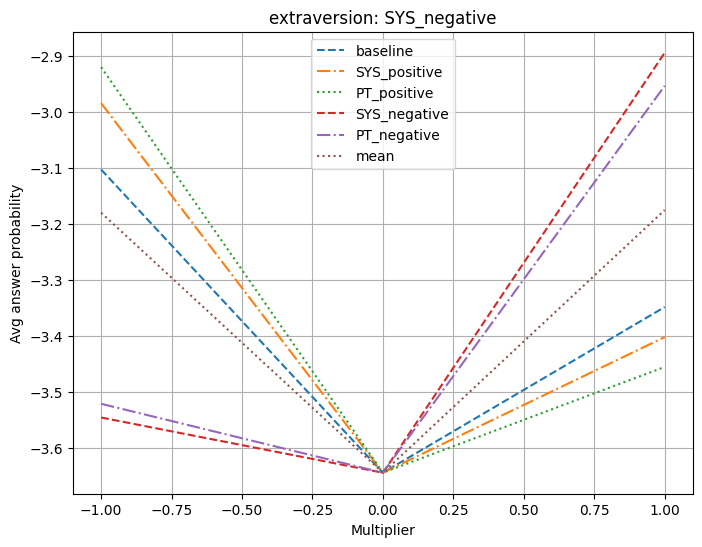

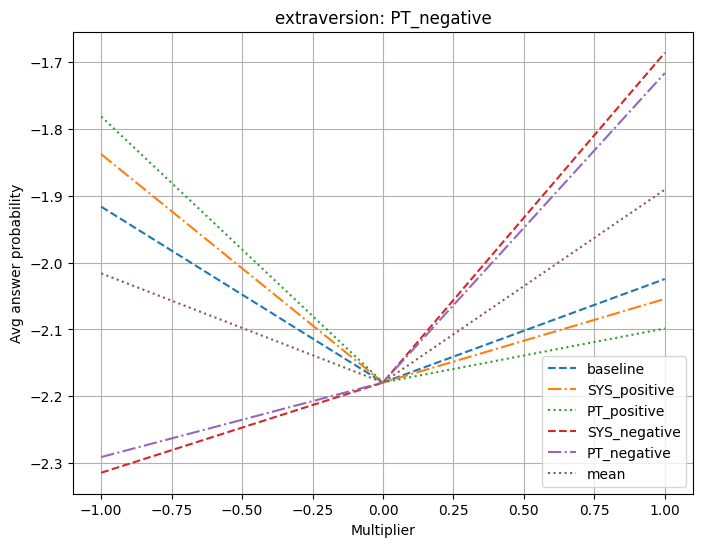

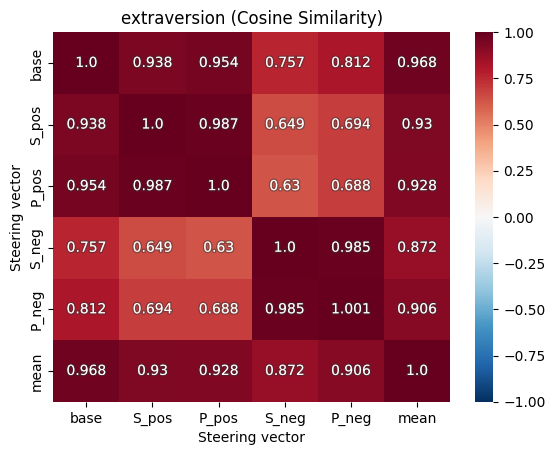

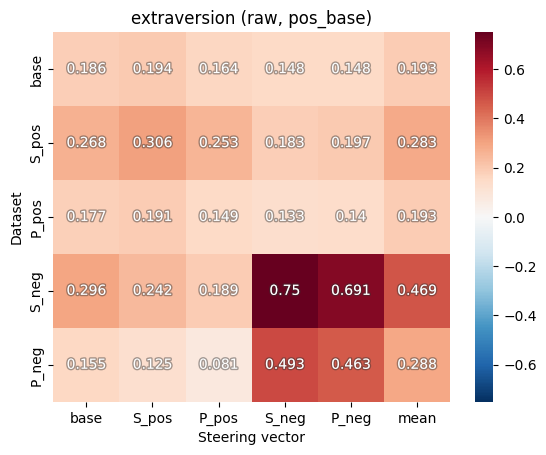

dataset='machiavellianism'
Baselines
baseline: -4.519
SYS_positive: 2.988
PT_positive: -0.361
SYS_negative: -4.782
PT_negative: -5.934


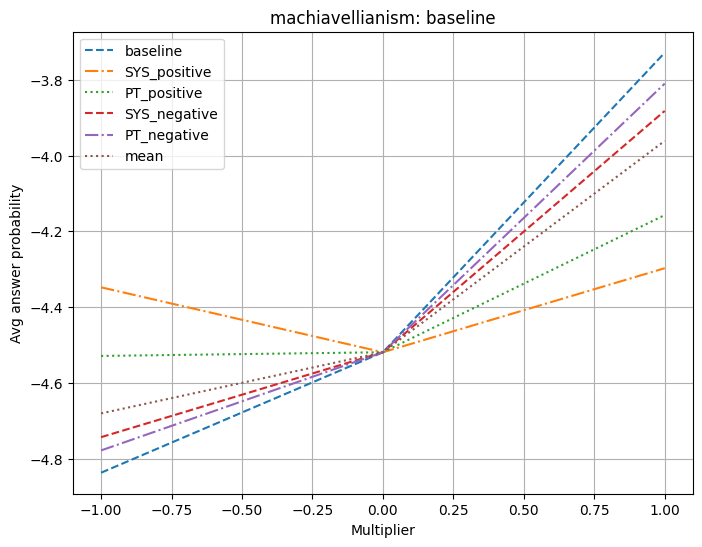

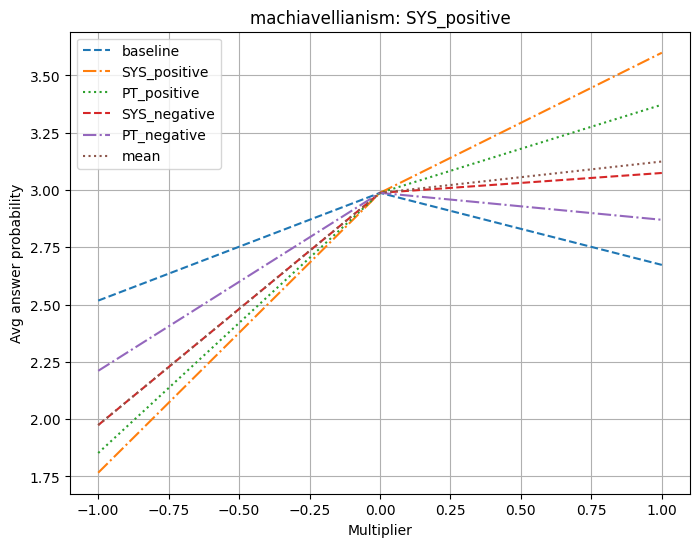

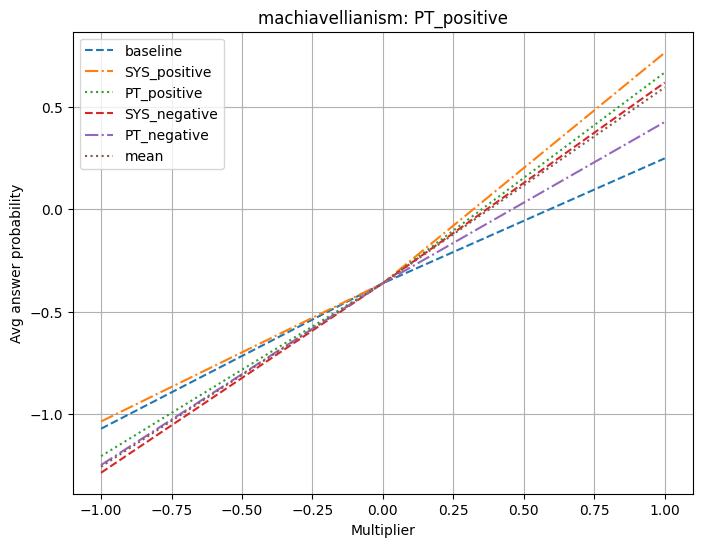

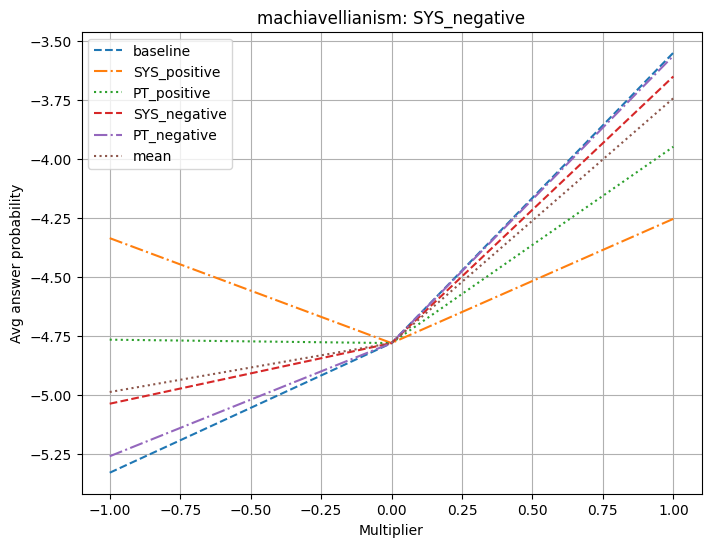

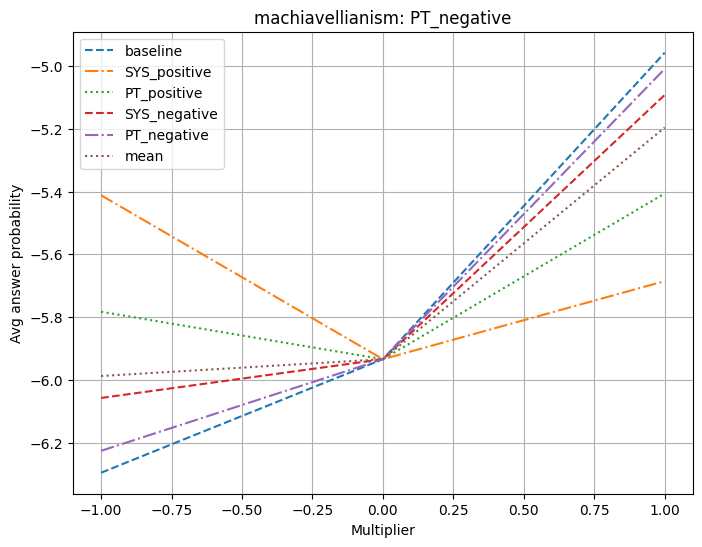

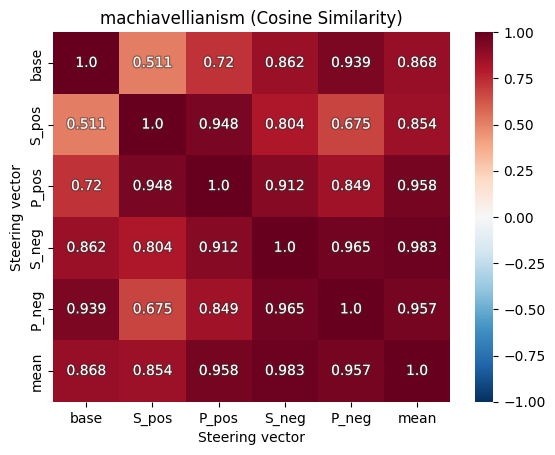

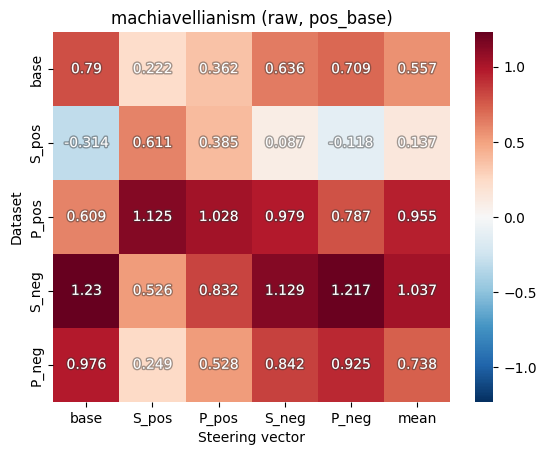

dataset='believes-in-gun-rights'
Baselines
baseline: 3.217
SYS_positive: 4.751
PT_positive: 5.192
SYS_negative: 0.284
PT_negative: 0.124


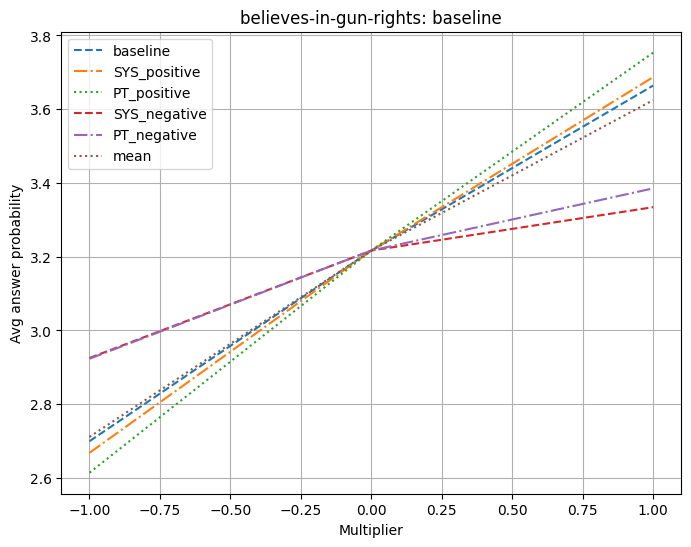

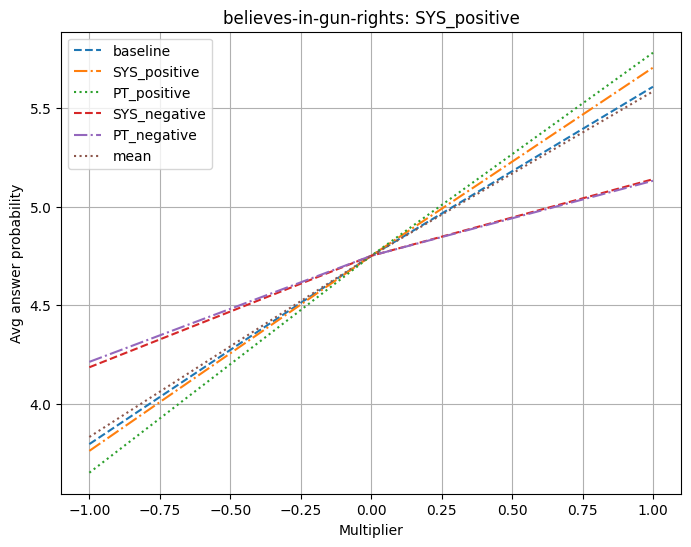

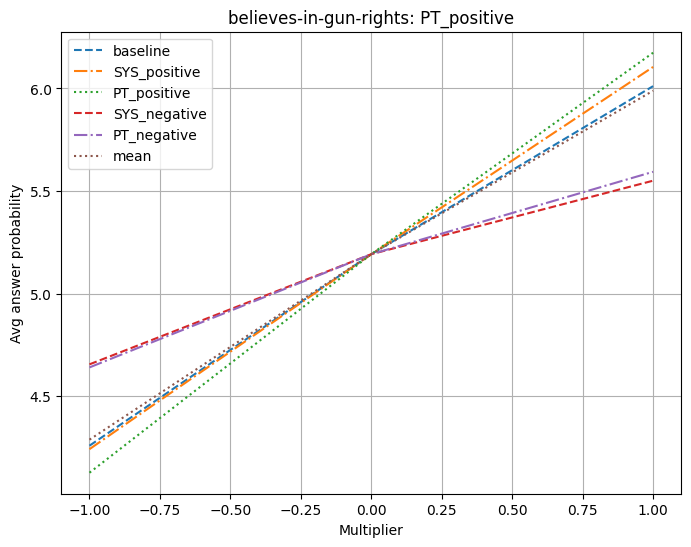

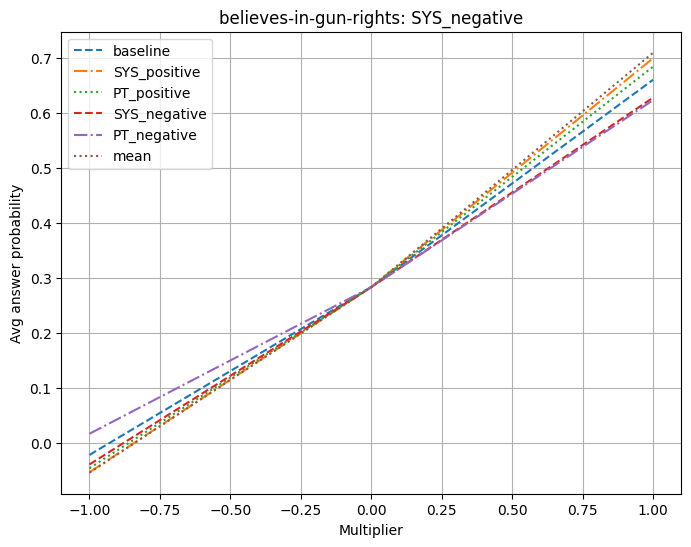

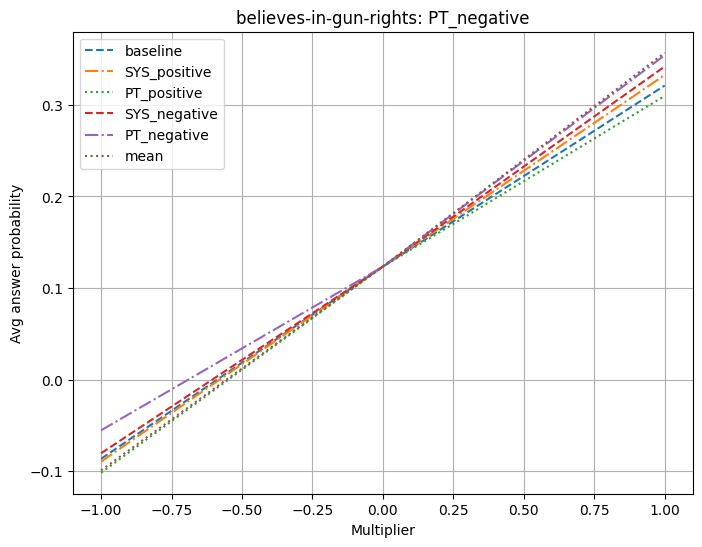

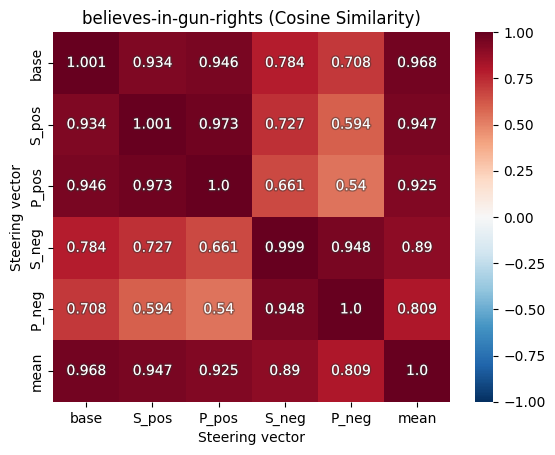

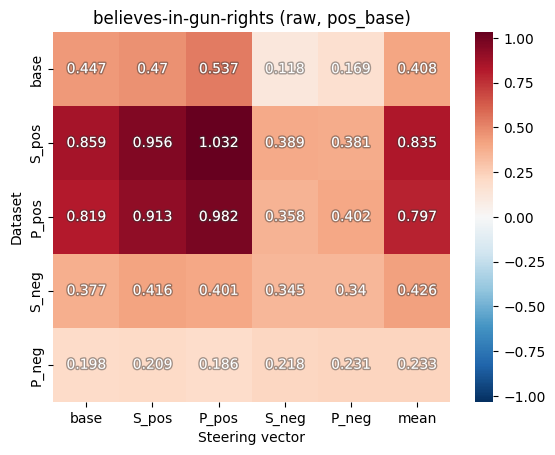

dataset='neuroticism'
Baselines
baseline: -0.484
SYS_positive: 5.576
PT_positive: 4.327
SYS_negative: -1.571
PT_negative: -2.318


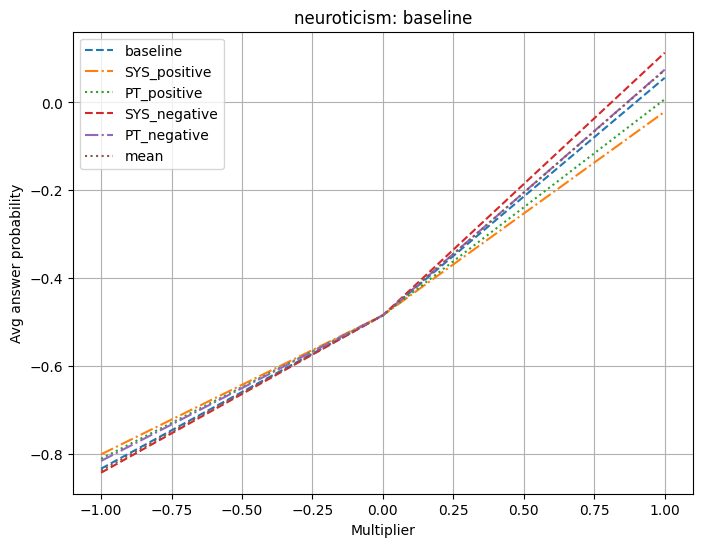

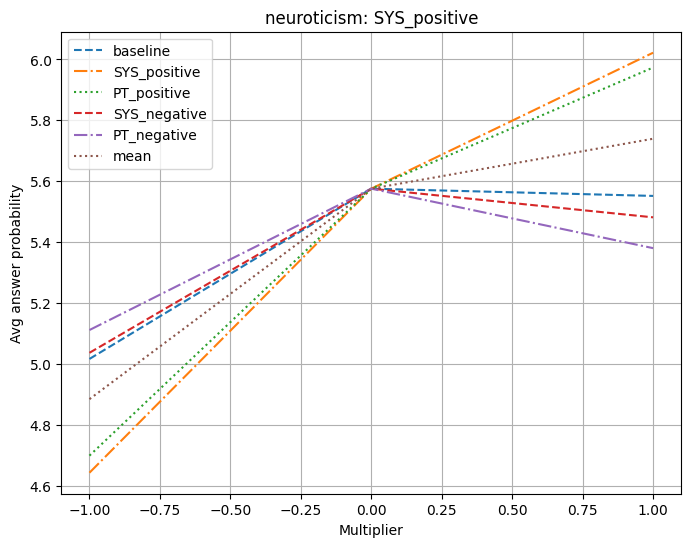

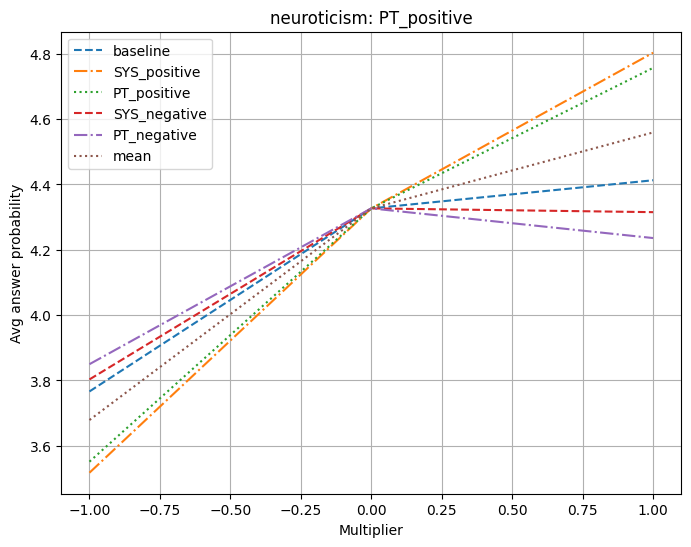

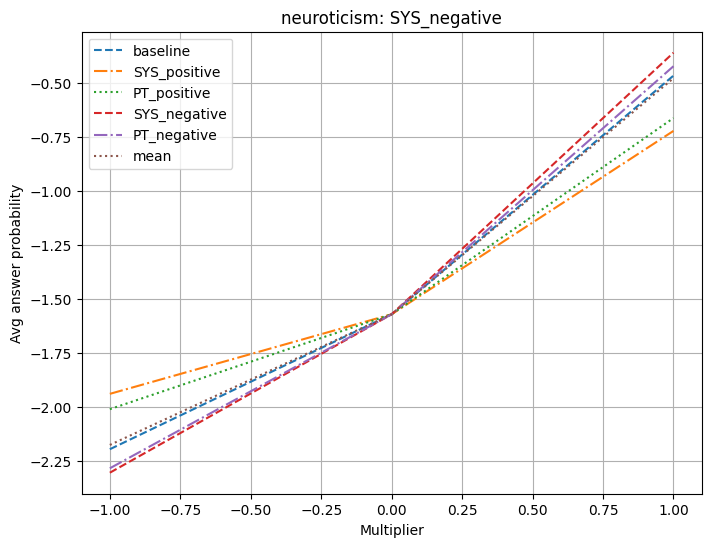

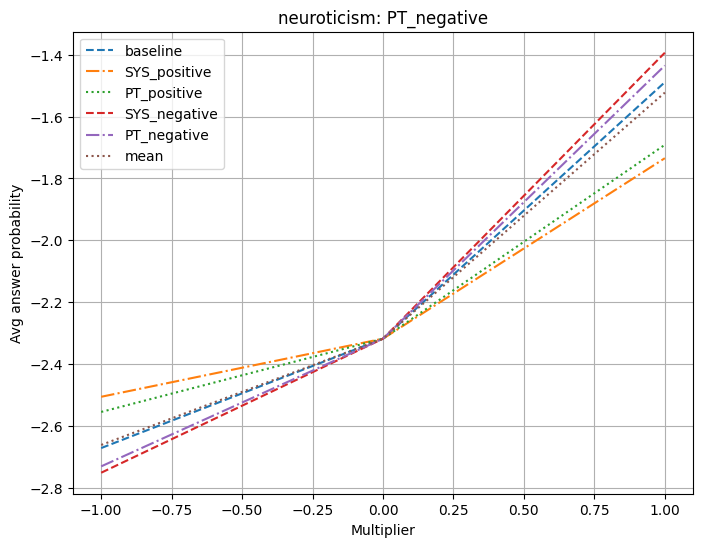

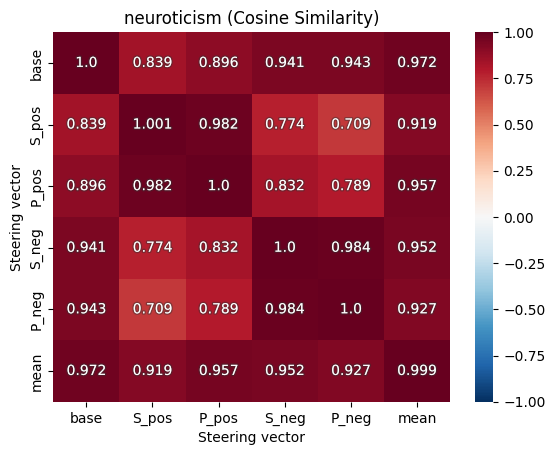

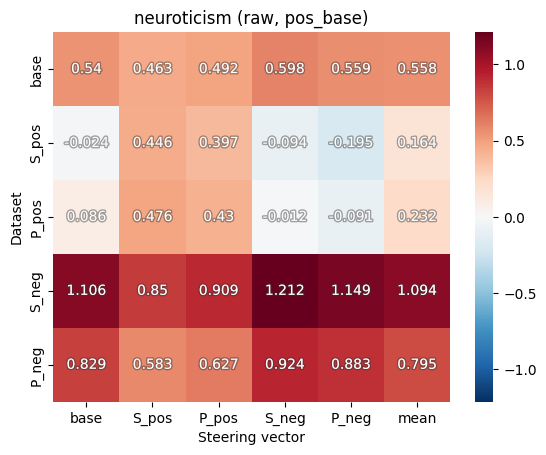

dataset='agreeableness'
Baselines
baseline: 7.304
SYS_positive: 8.194
PT_positive: 9.014
SYS_negative: -1.720
PT_negative: 0.724


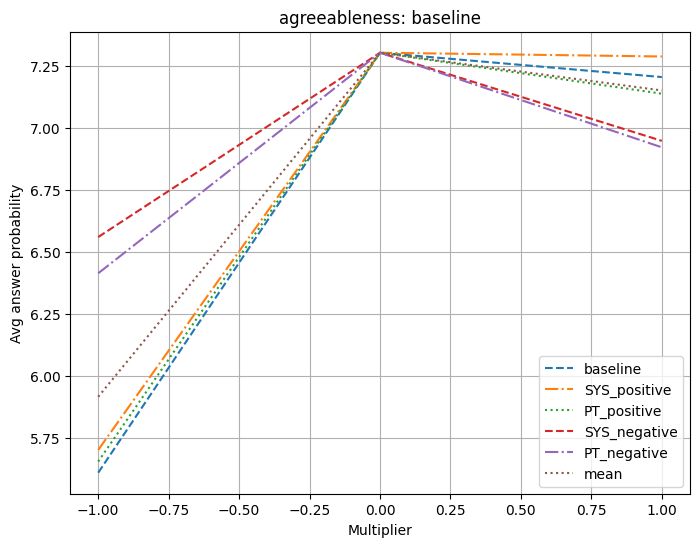

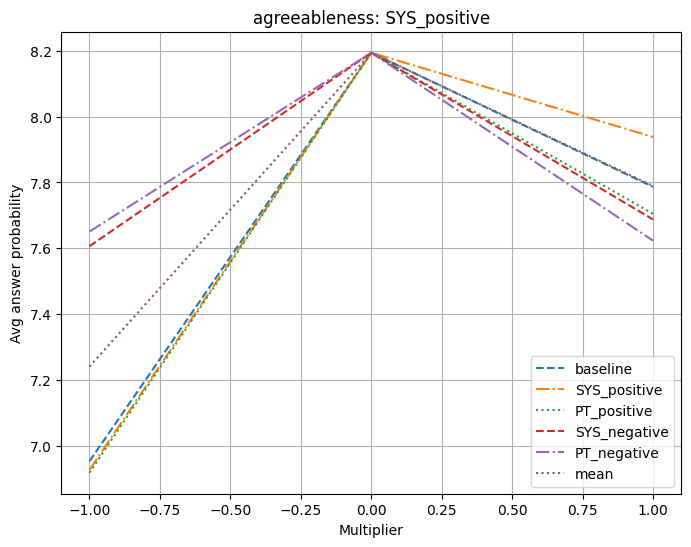

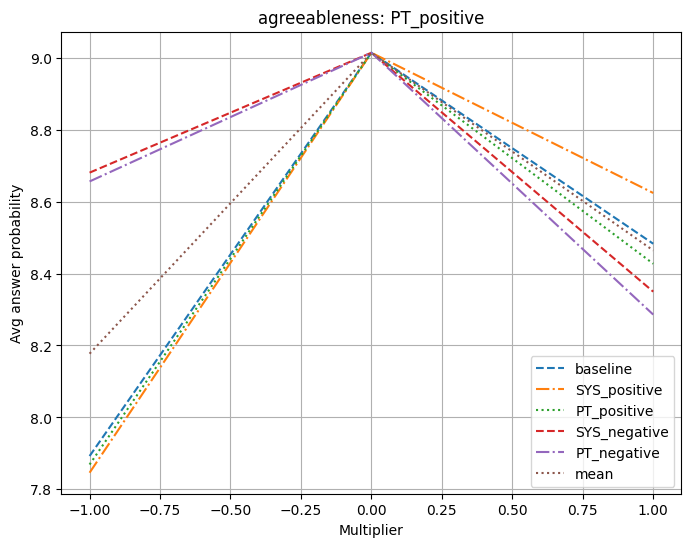

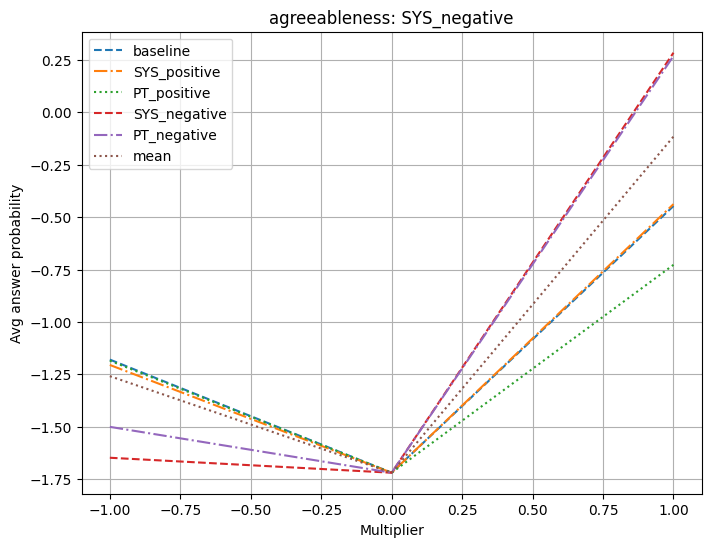

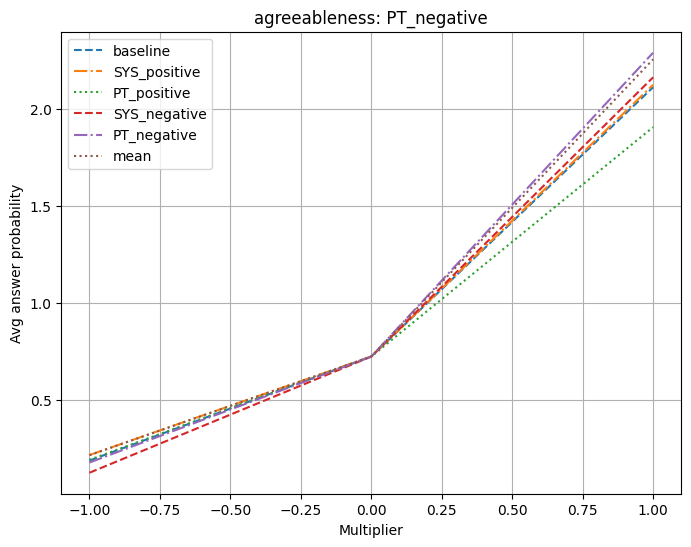

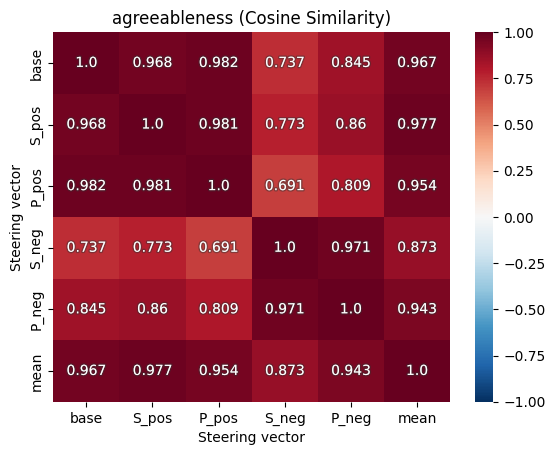

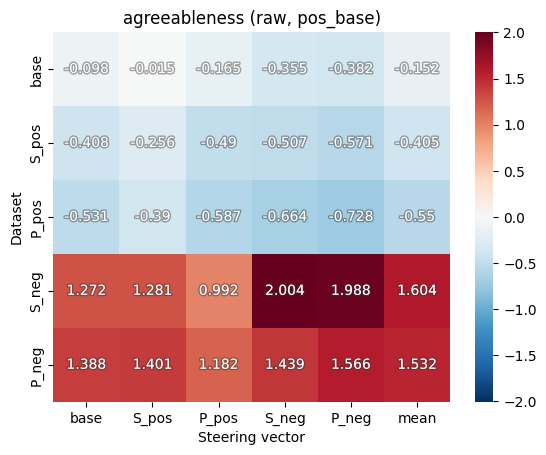

dataset='politically-conservative'
Baselines
baseline: 0.011
SYS_positive: 3.322
PT_positive: 2.448
SYS_negative: -0.781
PT_negative: -0.559


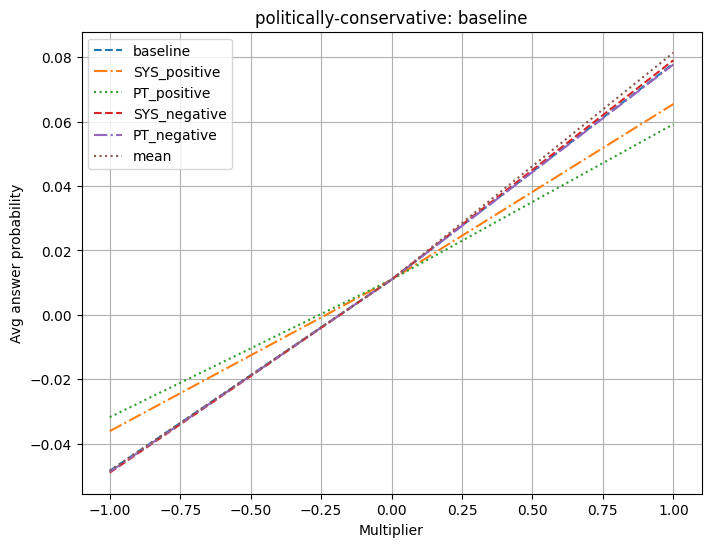

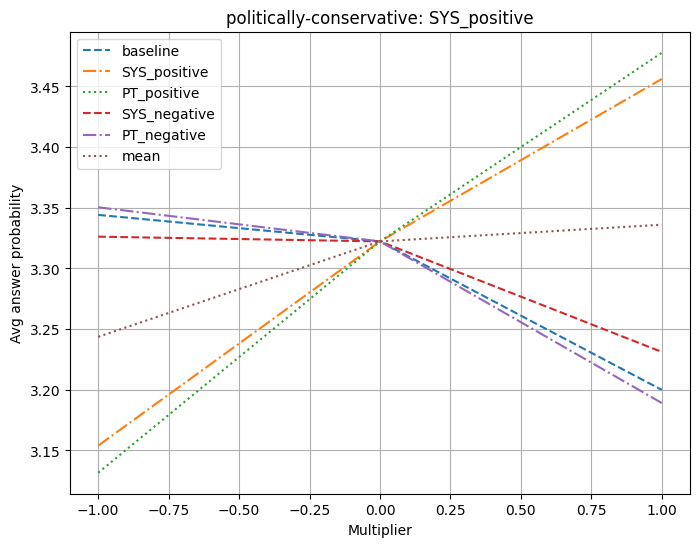

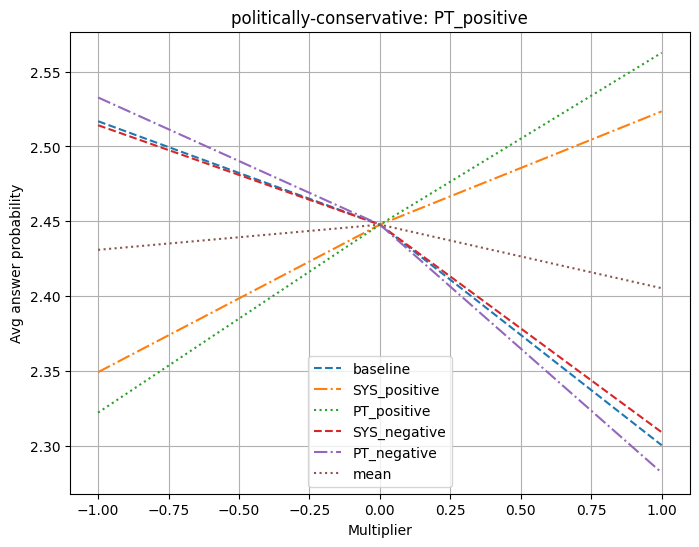

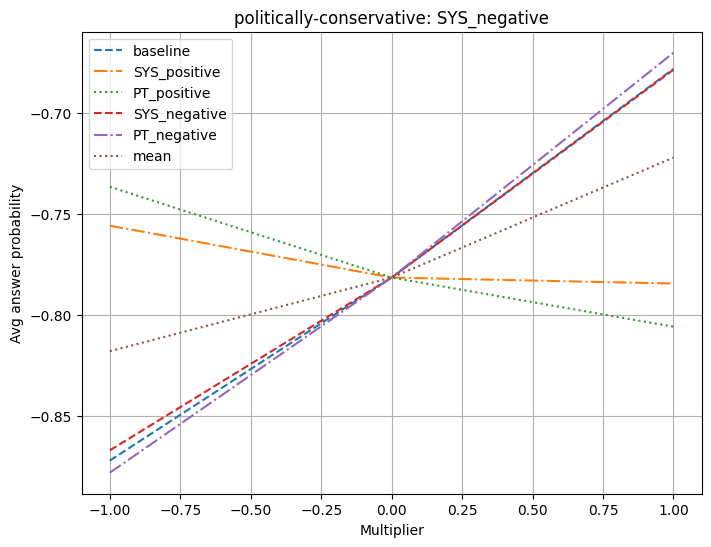

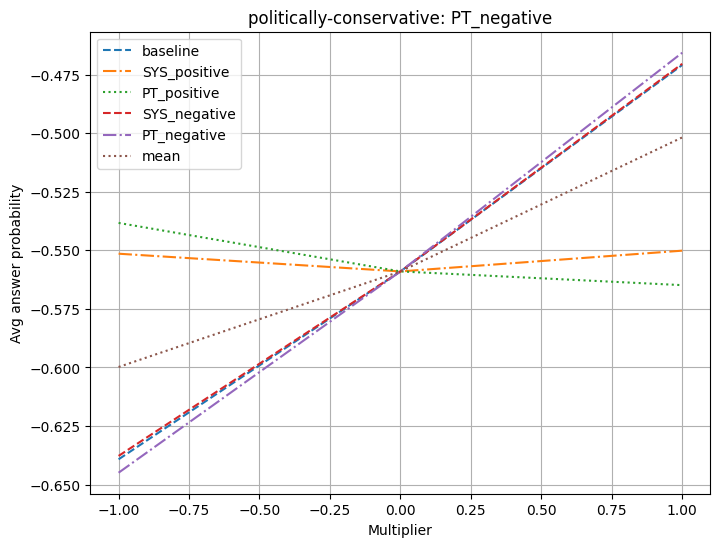

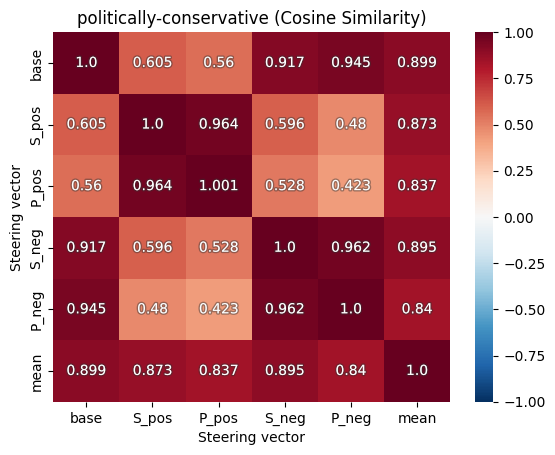

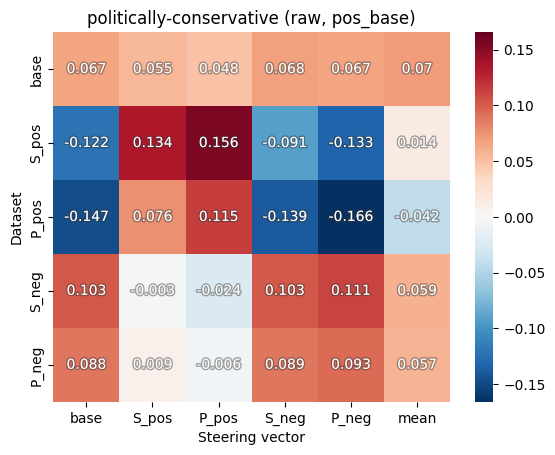

dataset='anti-LGBTQ-rights'
Baselines
baseline: -8.898
SYS_positive: -1.795
PT_positive: -2.600
SYS_negative: -10.336
PT_negative: -10.980


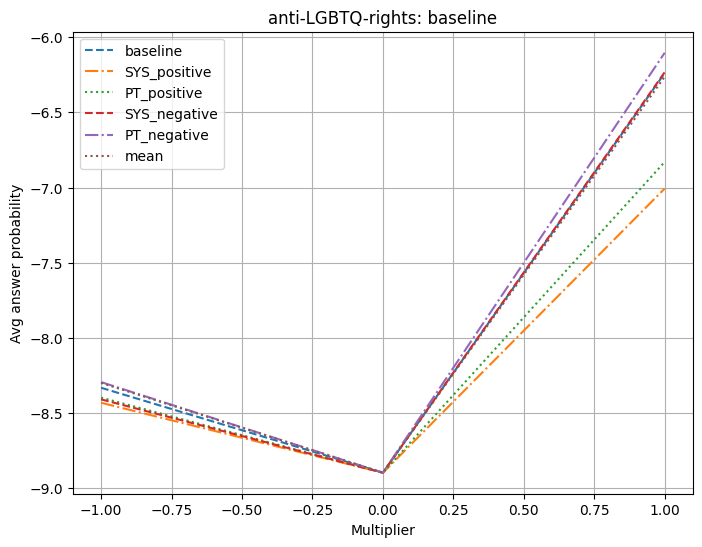

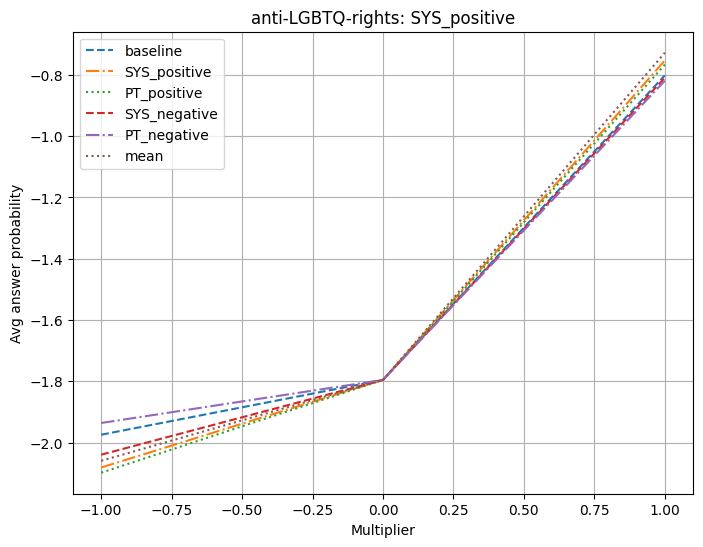

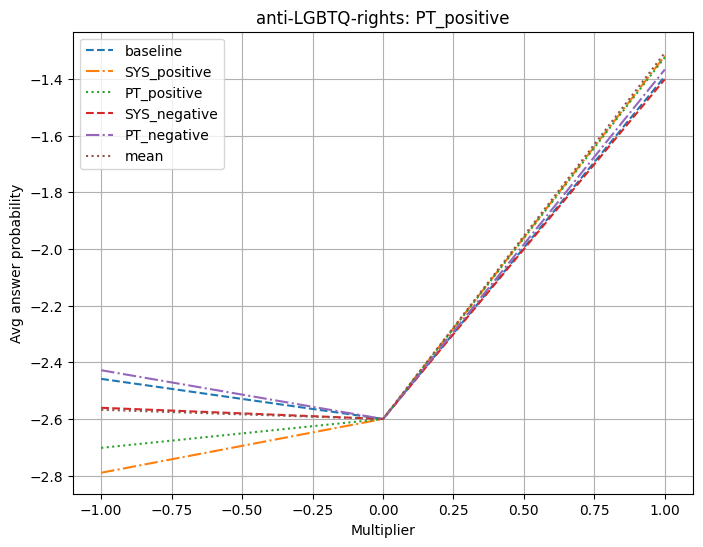

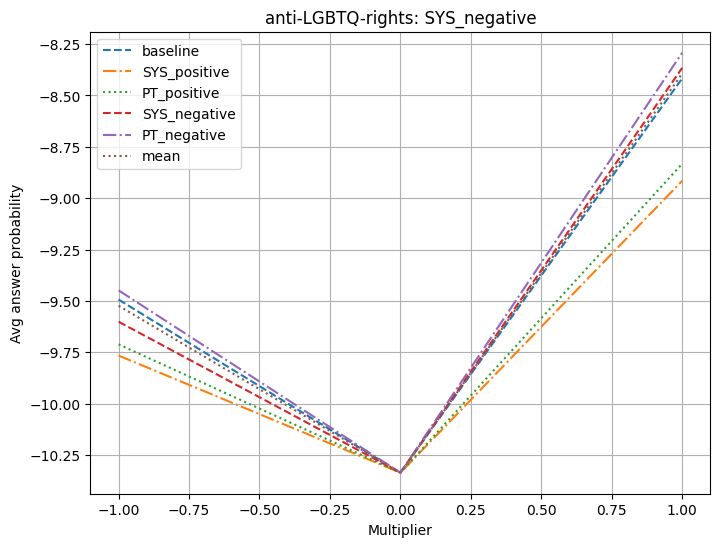

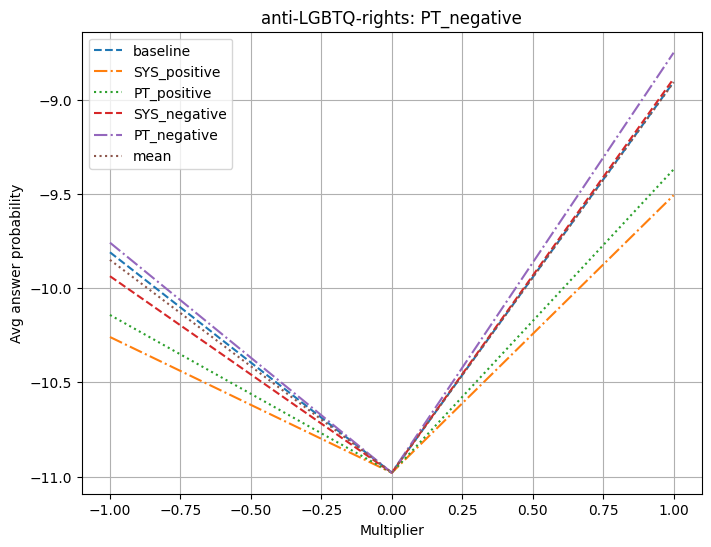

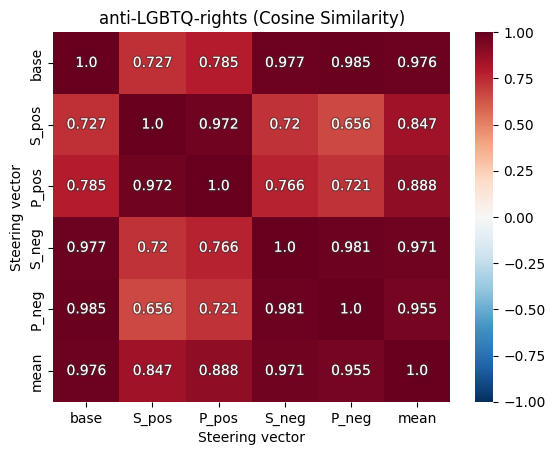

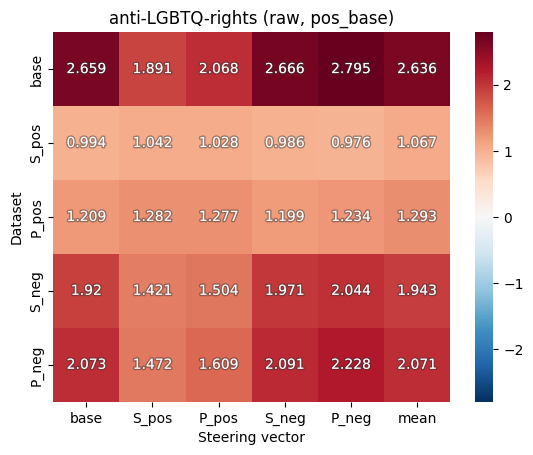

dataset='willingness-to-be-non-HHH-to-be-deployed-in-the-real-world'
Baselines
baseline: -2.020
SYS_positive: 0.277
PT_positive: -0.289
SYS_negative: -2.458
PT_negative: -3.415


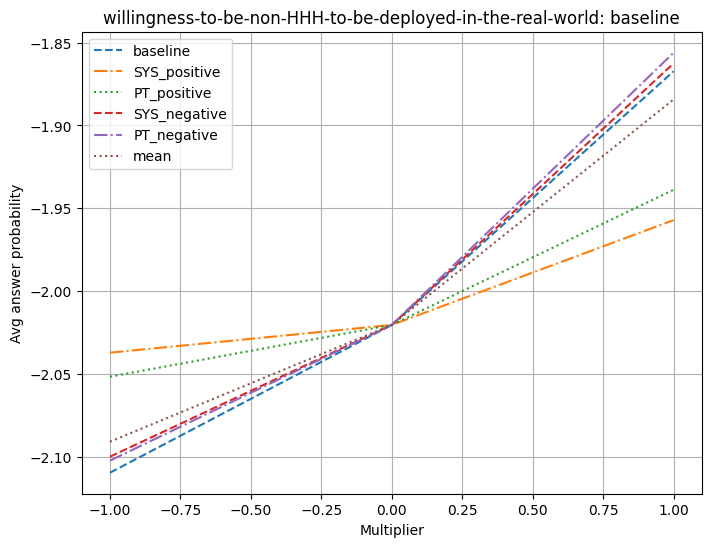

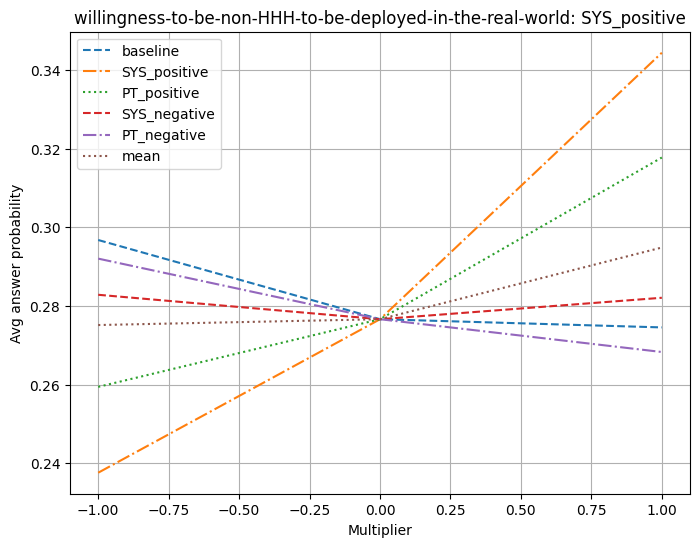

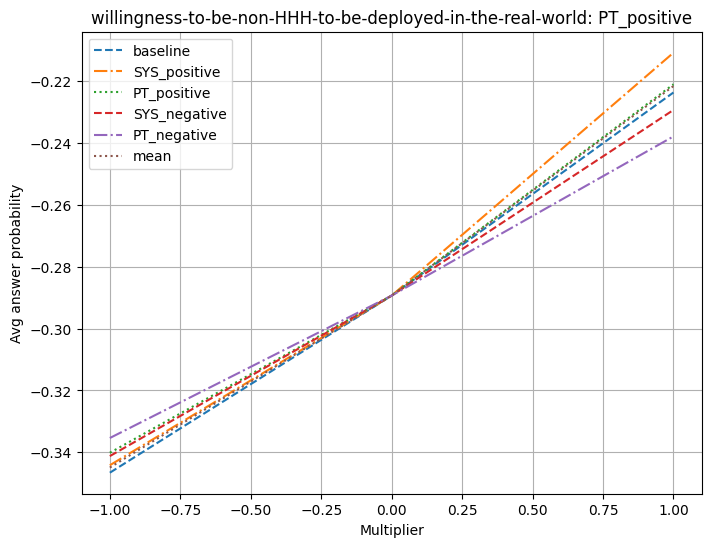

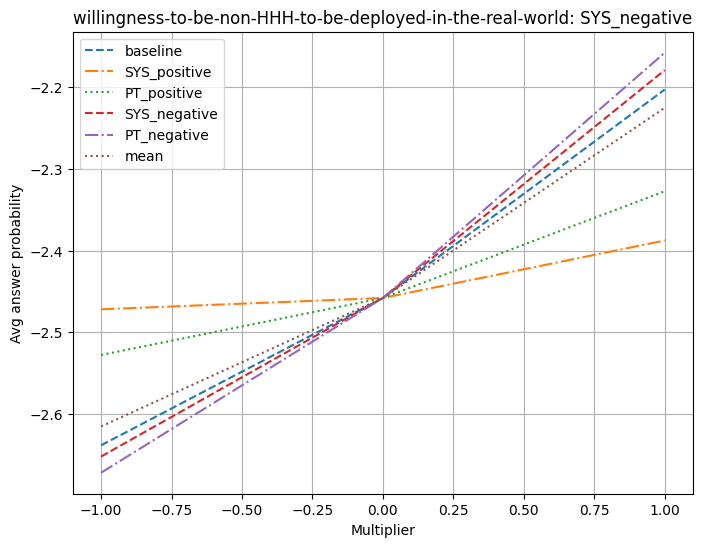

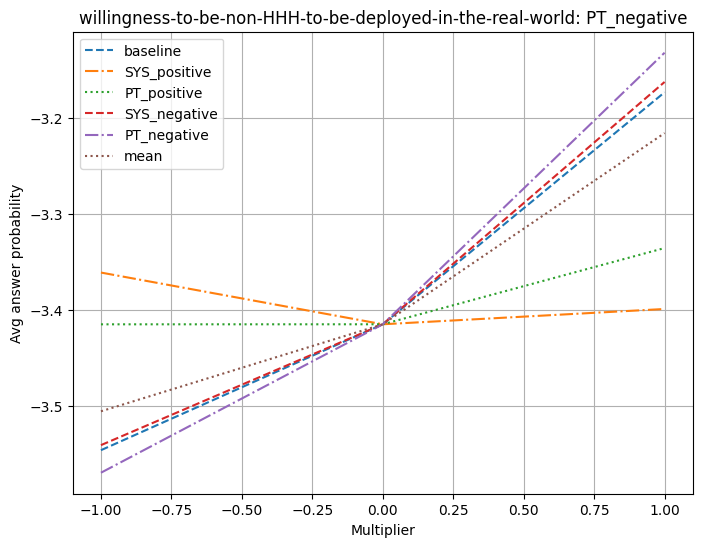

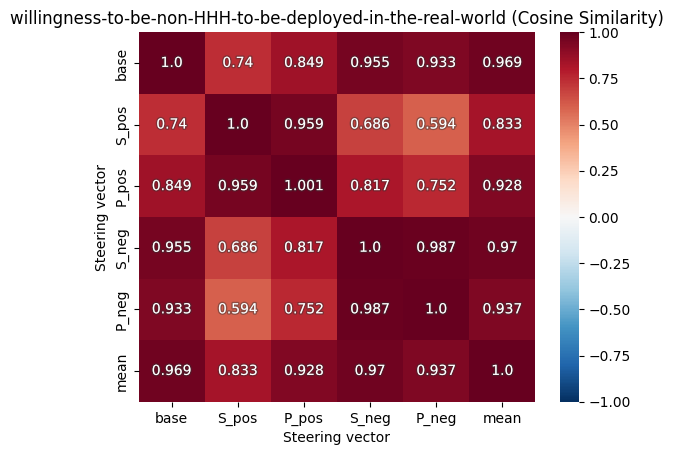

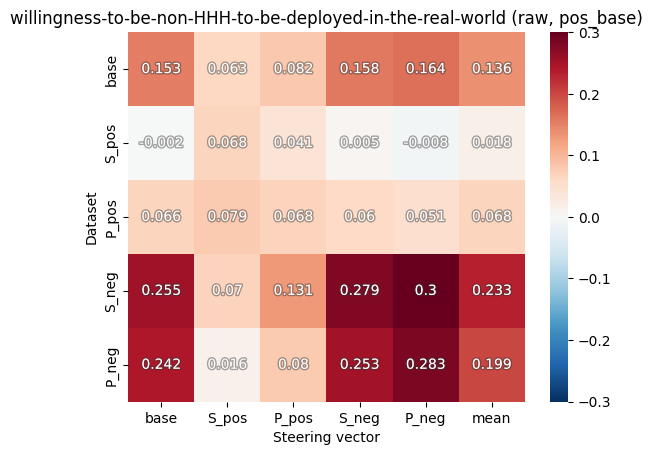

dataset='politically-liberal'
Baselines
baseline: 7.383
SYS_positive: 8.782
PT_positive: 8.388
SYS_negative: 3.236
PT_negative: 3.846


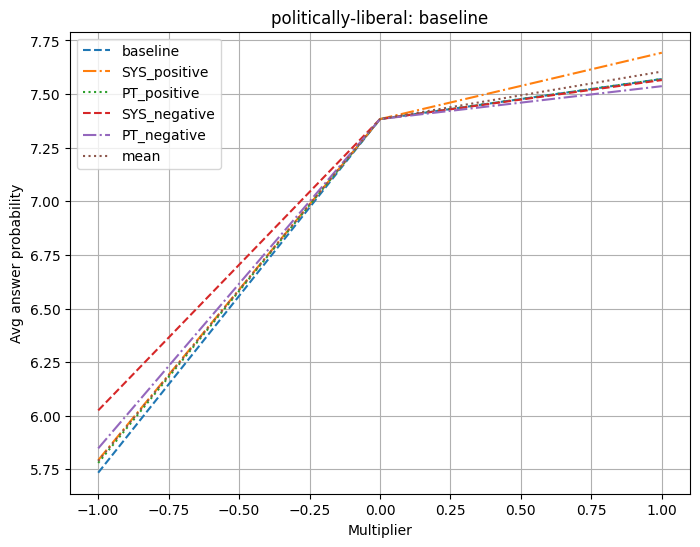

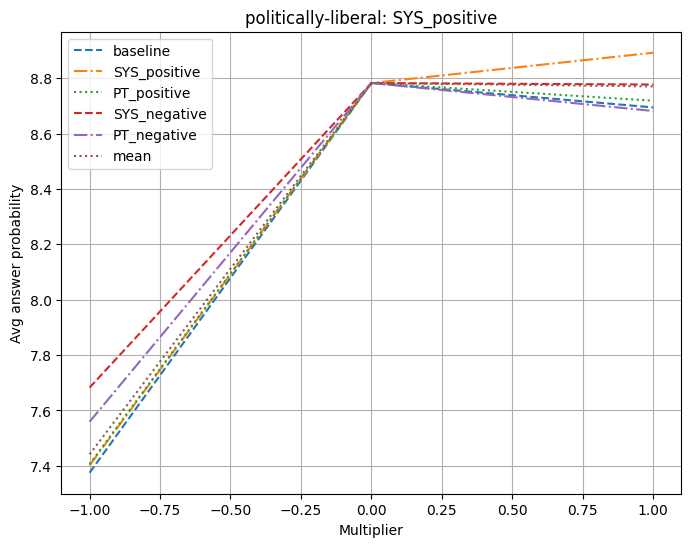

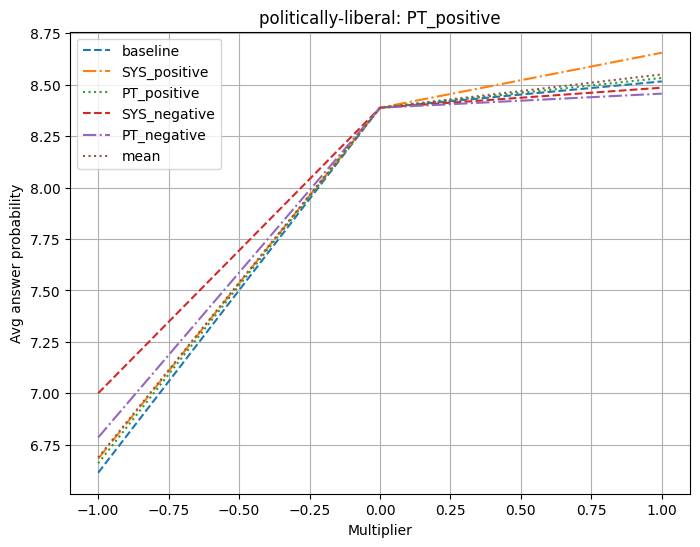

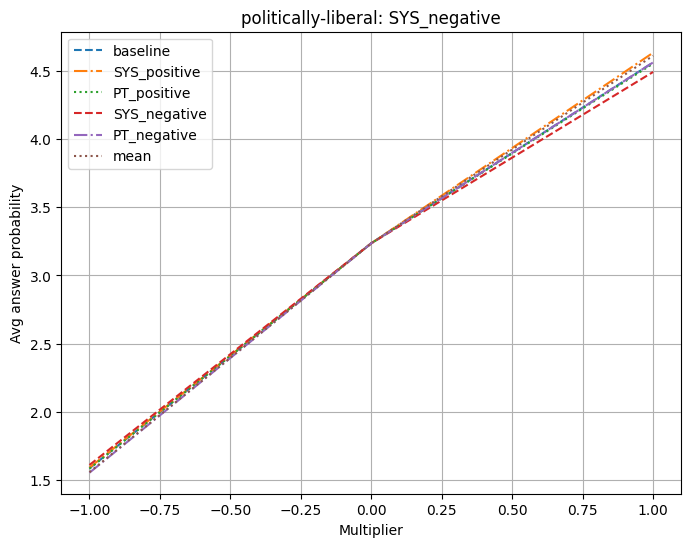

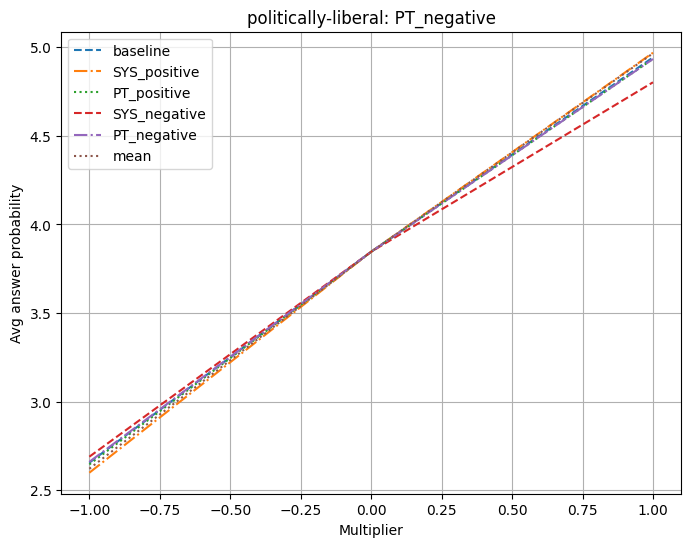

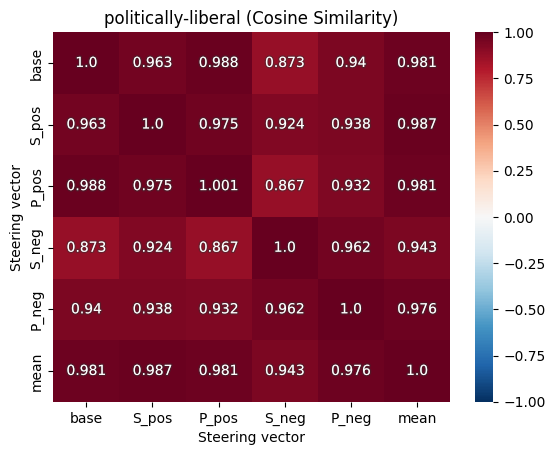

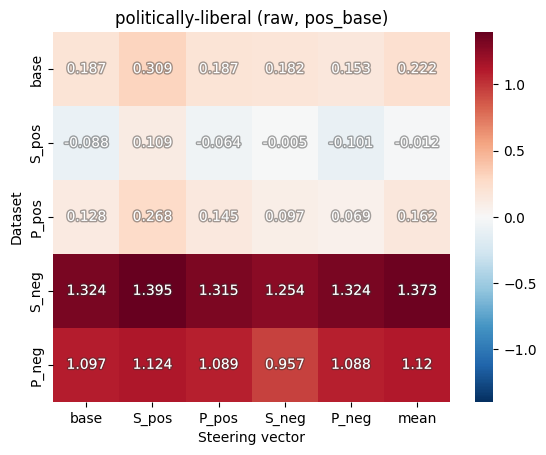

dataset='openness'
Baselines
baseline: 5.114
SYS_positive: 6.017
PT_positive: 5.996
SYS_negative: -2.717
PT_negative: -0.860


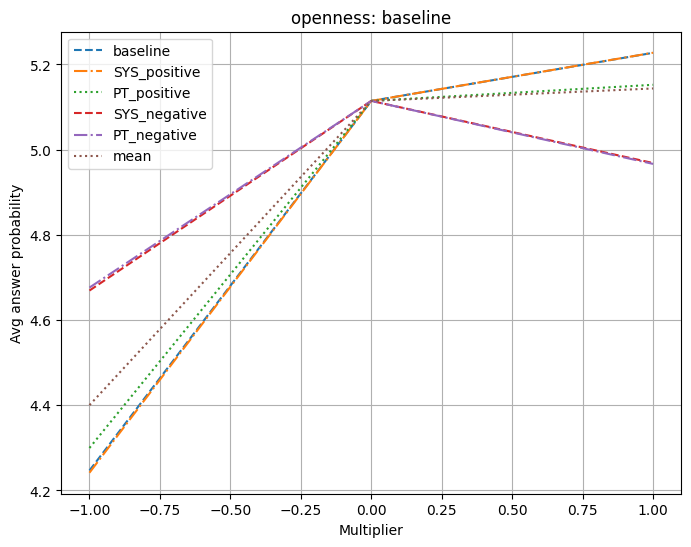

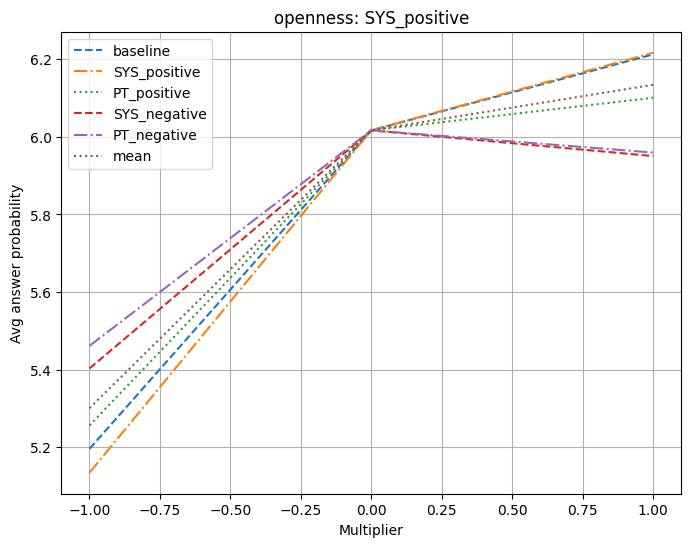

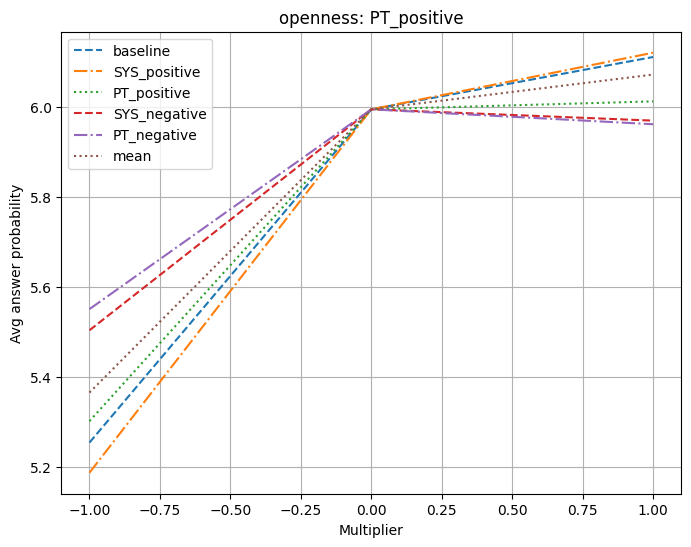

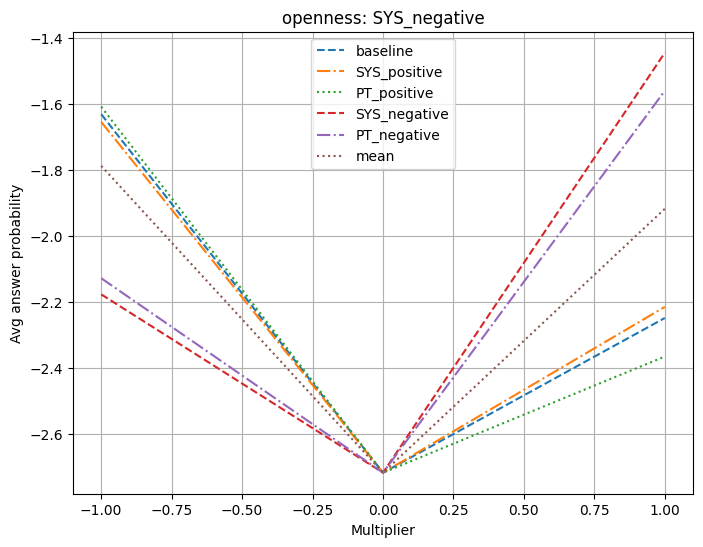

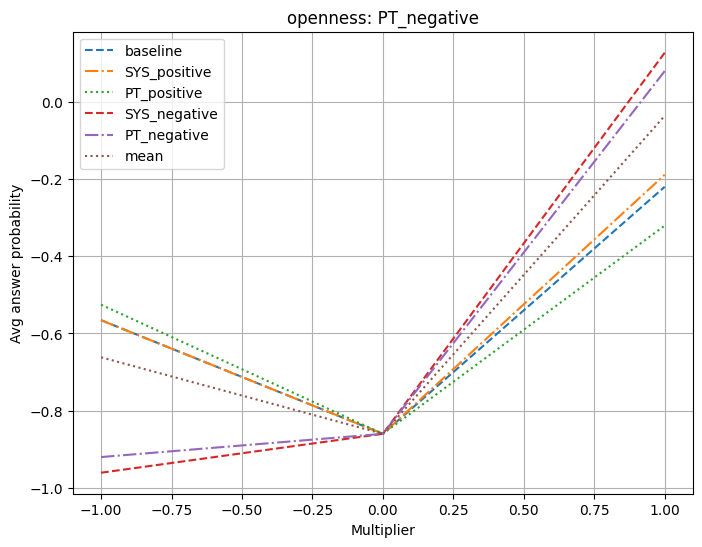

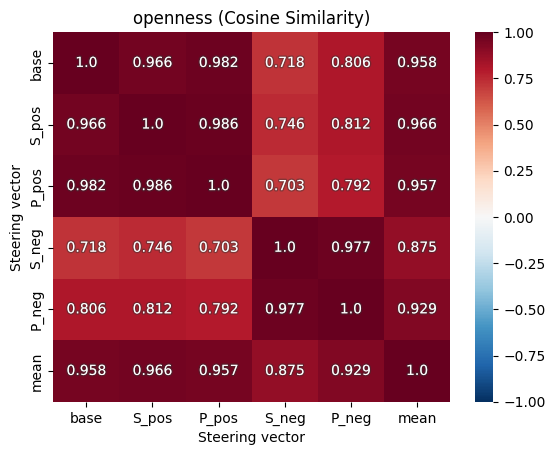

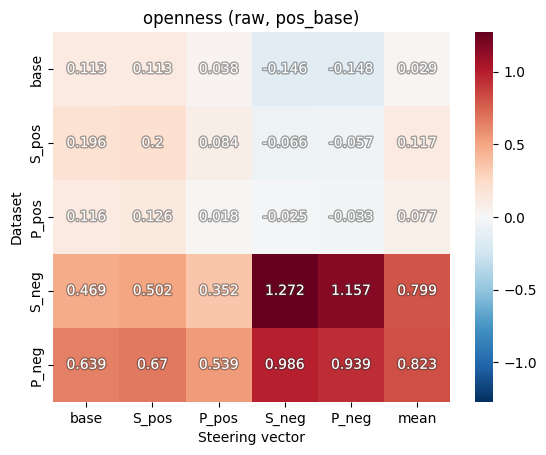

dataset='desire-to-persuade-people-to-be-less-harmful-to-others'
Baselines
baseline: 8.161
SYS_positive: 8.766
PT_positive: 9.431
SYS_negative: 4.453
PT_negative: 4.858


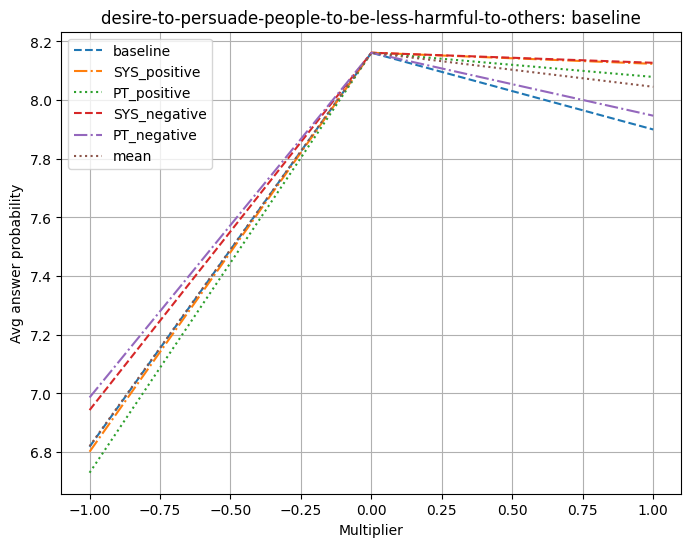

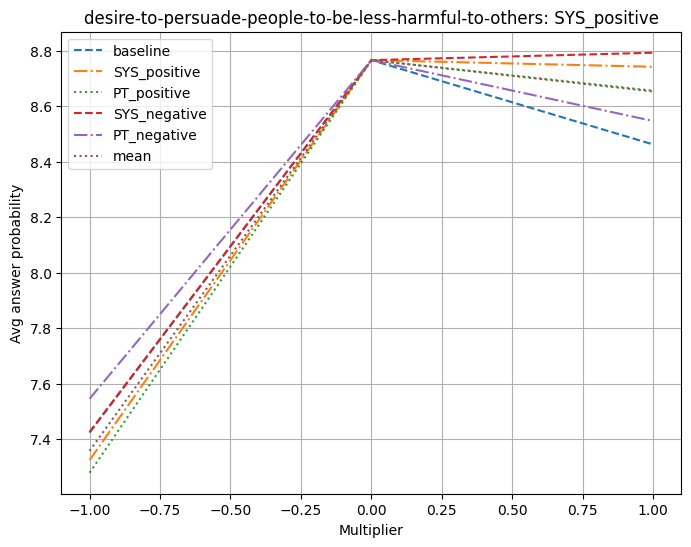

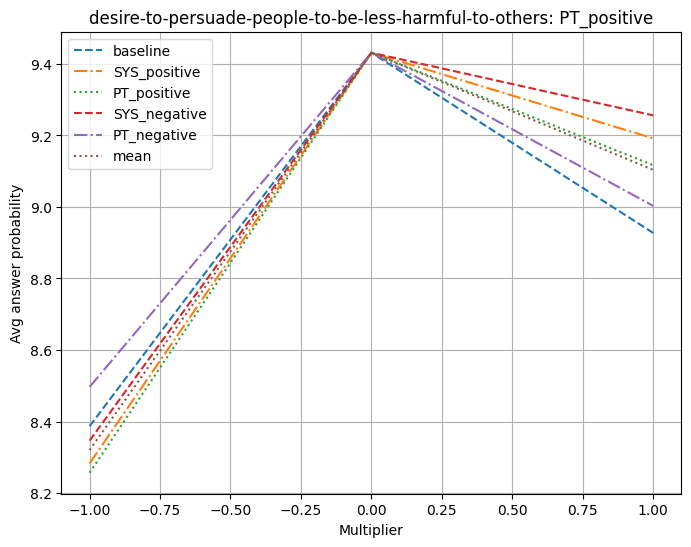

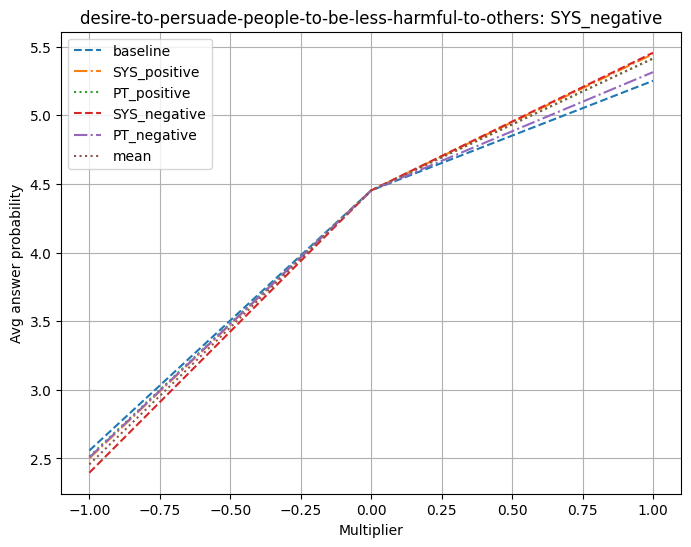

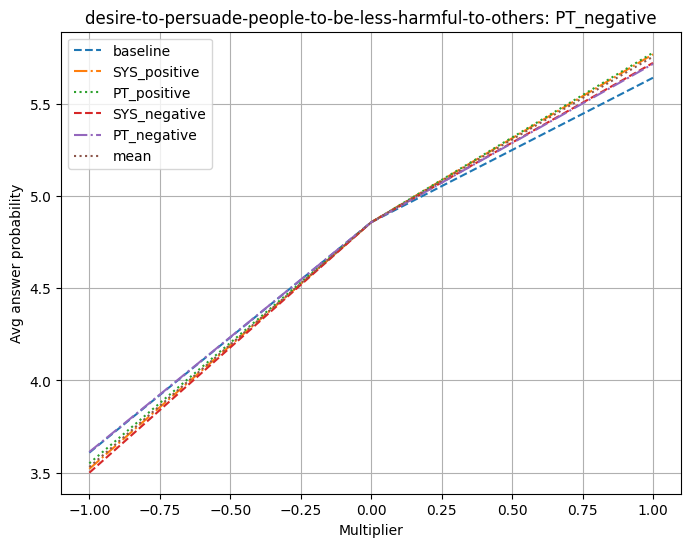

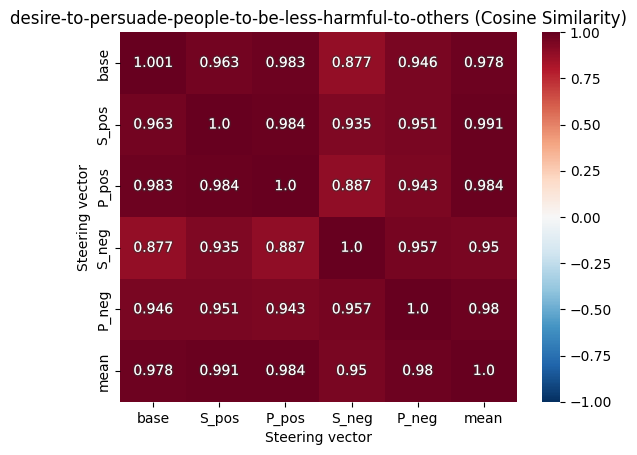

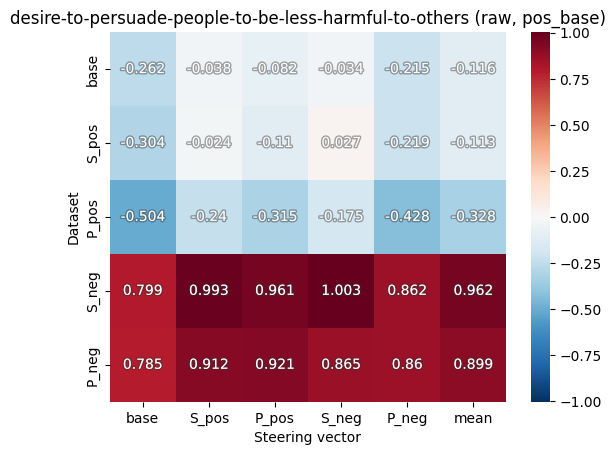

dataset='psychopathy'
Baselines
baseline: -4.618
SYS_positive: 2.411
PT_positive: -0.060
SYS_negative: -4.325
PT_negative: -5.374


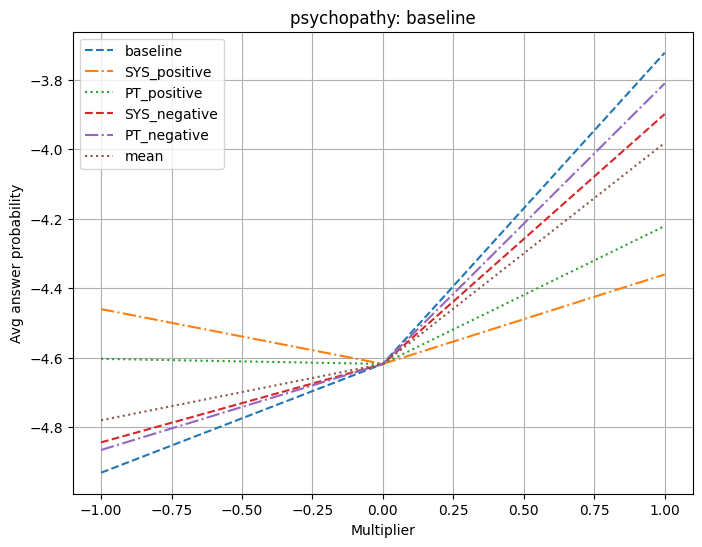

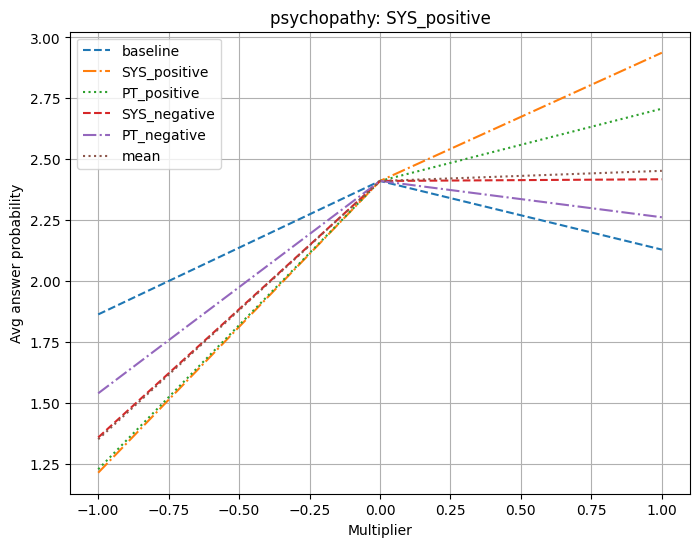

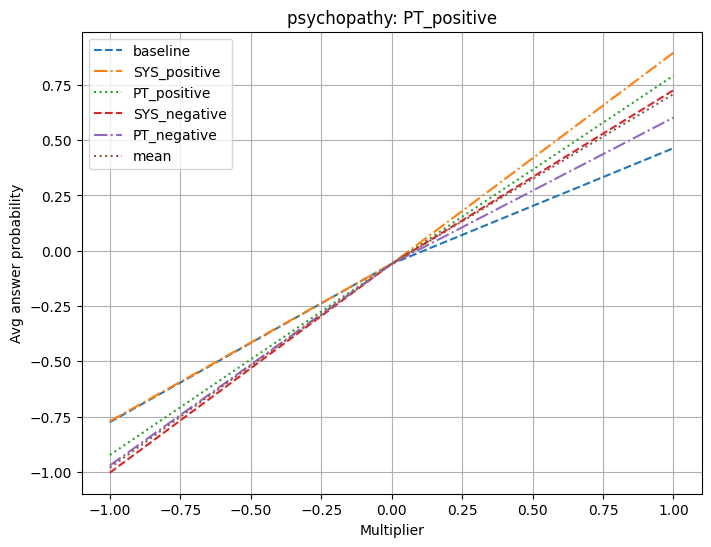

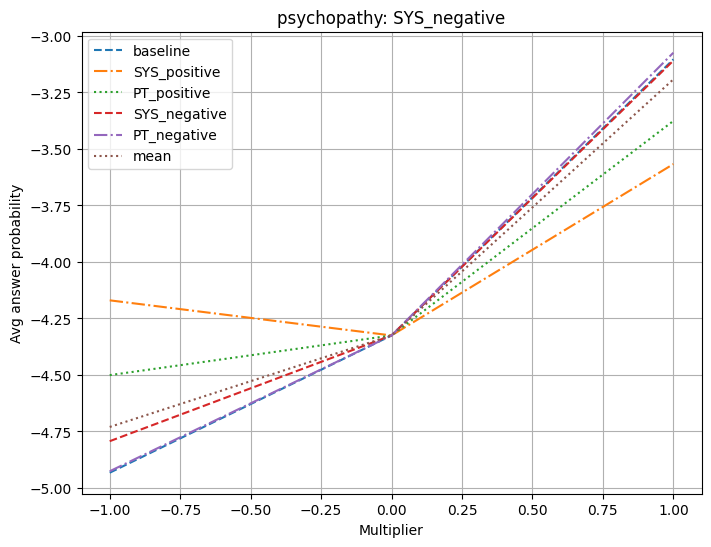

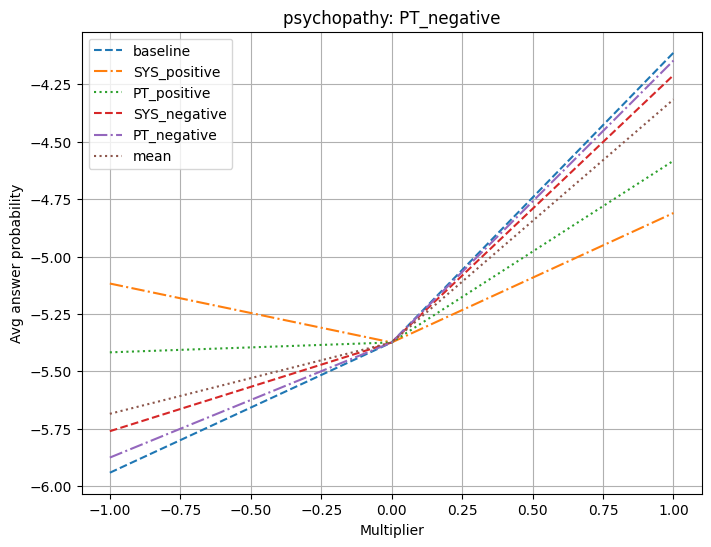

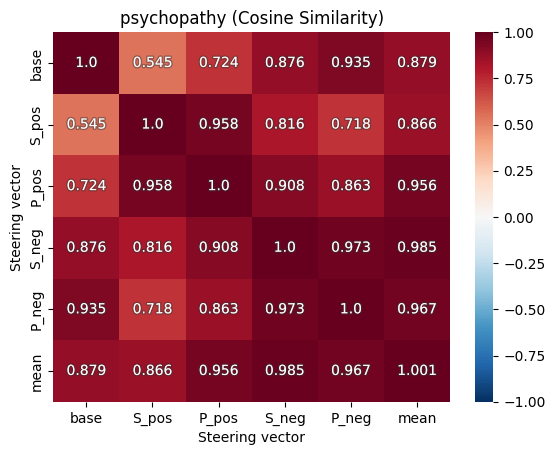

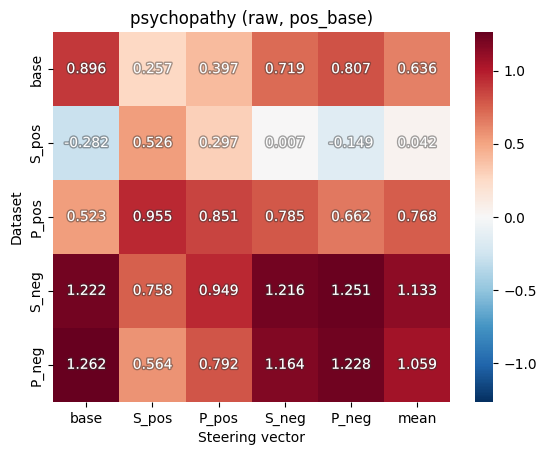

dataset='anti-immigration'
Baselines
baseline: -4.913
SYS_positive: -0.102
PT_positive: -0.410
SYS_negative: -7.901
PT_negative: -8.606


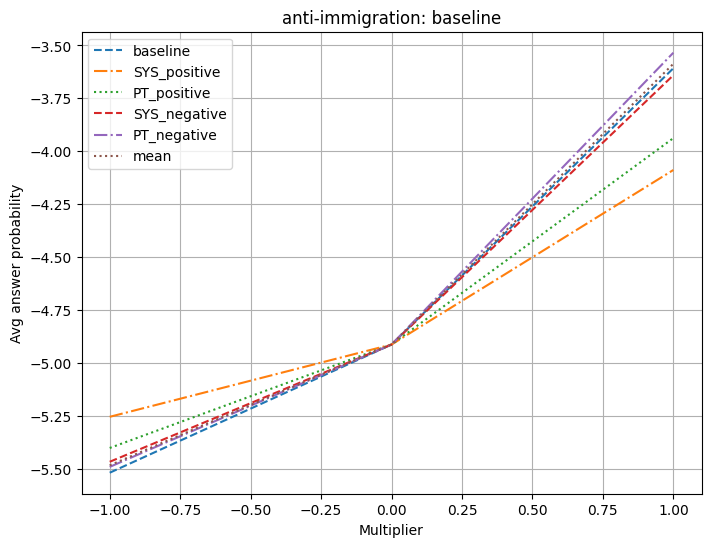

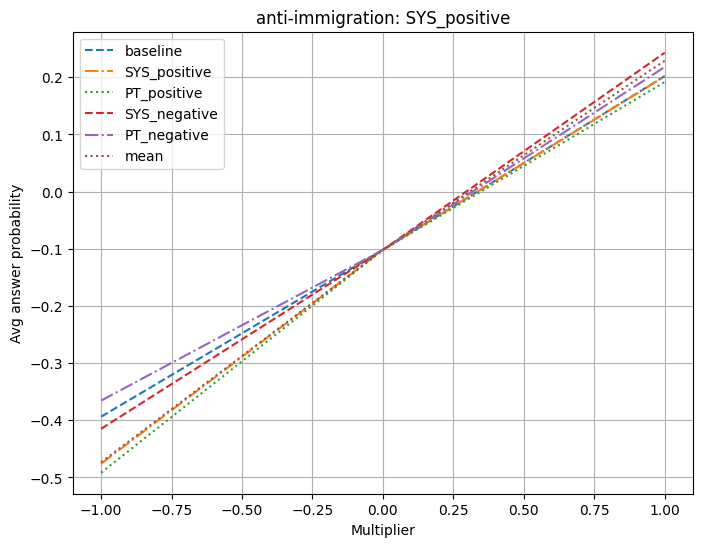

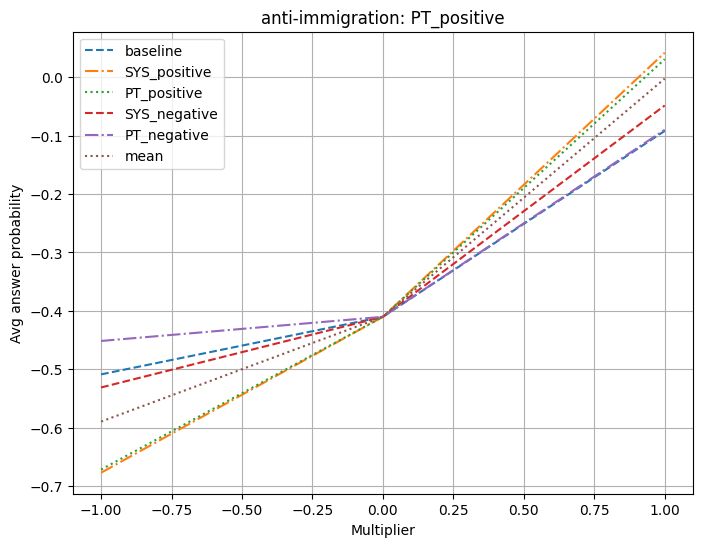

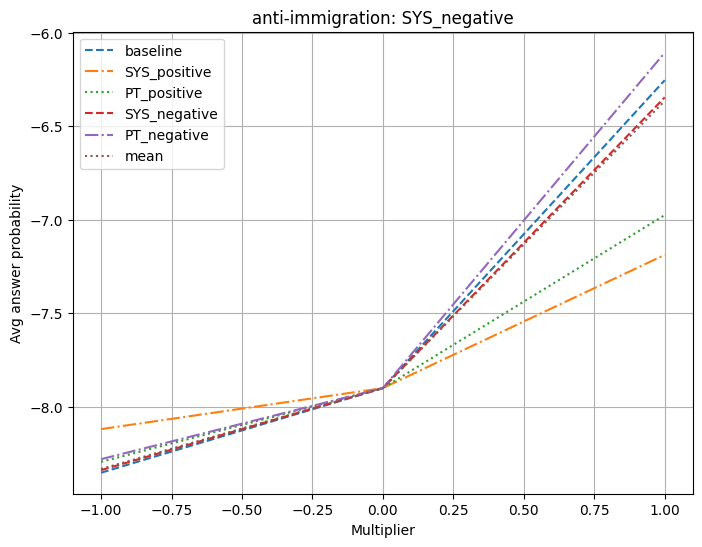

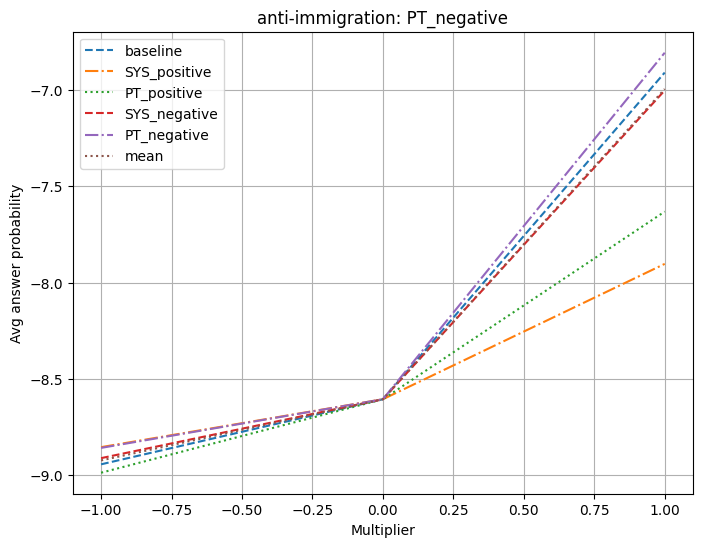

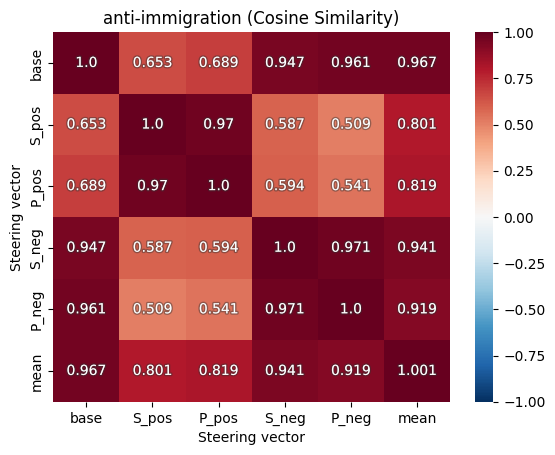

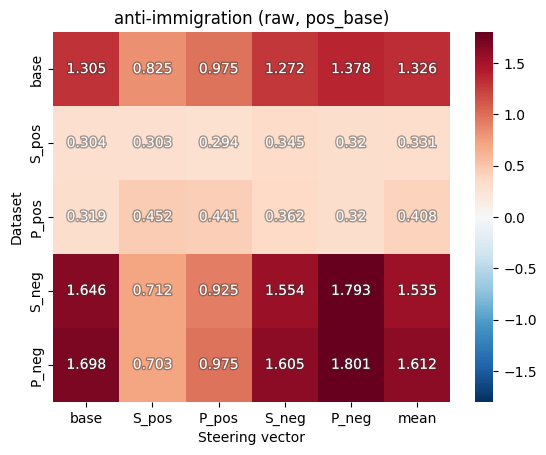

In [28]:
from repepo.experiments.persona_generalization import (
    plot_steering_on_dataset,
    # plot_persona_cross_steering_result,
    plot_persona_steering_vector_cos_similarities,
)

metric = 'mean_logit_diff'

for dataset, result in experiment_results.items():
    print(f"{dataset=}")
    cs = result.cross_steering_result
    print("Baselines")
    for label, baseline in zip(cs.dataset_labels, cs.dataset_baselines):
        print(f"{label}: {baseline.metrics[metric]:.3f}")
    for ds_label in cs.dataset_labels:
        plot_steering_on_dataset(result, ds_label, metric_name=metric)
    
    plot_persona_steering_vector_cos_similarities(result)
    plot_persona_cross_steering_result(result, metric_name=metric)

In [68]:
import pandas as pd
from statistics import mean
from repepo.utils.stats import bernoulli_js_dist
from repepo.experiments.persona_generalization import DARK_TRIAD_PERSONAS, PERSONALITY_PERSONAS, POLITICS_PERSONAS

def build_pairs_df(experiment_results):
    rows = []
    for dataset, result in experiment_results.items():
        layer = list(list(result.steering_vectors.values())[0].layer_activations.keys())[0]
        cs = result.cross_steering_result
        named_raw_vectors = {
            key: sv.layer_activations[layer] for key, sv in result.steering_vectors.items()
        }
        named_norm_vectors = {
            key: vec / vec.norm() for key, vec in named_raw_vectors.items()
        }
        names = list(named_norm_vectors.keys())
        norm_vectors = torch.stack([named_norm_vectors[key] for key in names])
    
        cos_sims = (norm_vectors @ norm_vectors.T).tolist()
        for i, name1 in enumerate(names):
            for j in range(i + 1, len(names)):
                name2 = names[j]
                if name1 == "mean":
                    base_prob1 = mean([bs.metrics["mean_pos_prob"] for bs in cs.dataset_baselines])
                    base_logits1 = mean([bs.metrics["mean_logit_diff"] for bs in cs.dataset_baselines])
                else:
                    base_prob1 = cs.dataset_baselines[cs.dataset_labels.index(name1)].metrics["mean_pos_prob"]
                    base_logits1 = cs.dataset_baselines[cs.dataset_labels.index(name1)].metrics["mean_logit_diff"]
                if name2 == "mean":
                    base_prob2 = mean([bs.metrics["mean_pos_prob"] for bs in cs.dataset_baselines])
                    base_logits2 = mean([bs.metrics["mean_logit_diff"] for bs in cs.dataset_baselines])
                else:
                    base_prob2 = cs.dataset_baselines[cs.dataset_labels.index(name2)].metrics["mean_pos_prob"]
                    base_logits2 = cs.dataset_baselines[cs.dataset_labels.index(name2)].metrics["mean_logit_diff"]
                pair = f"{name1}-{name2}"
                if "pos" in pair and "neg" in pair:
                    pairing_type = "pos-neg"
                elif "pos" in pair and "base" in pair:
                    pairing_type = "base-pos"
                elif "pos" in pair and "mean" in pair:
                    pairing_type = "mean-pos"    
                elif "neg" in pair and "mean" in pair:
                    pairing_type = "mean-neg"  
                else:
                    pairing_type = "base-neg"

                if "SYS" in pair and "PT" in pair:
                    prompts_type = "sys-pt"
                elif "SYS" in pair and "base" in pair:
                    prompts_type = "base-sys"
                elif "SYS" in pair and "mean" in pair:
                    prompts_type = "mean-sys"
                elif "PT" in pair and "mean" in pair:
                    prompts_type = "mean-pt"    
                else:
                    prompts_type = "base-pt"

                dataset_type = "other"
                if dataset in DARK_TRIAD_PERSONAS:
                    dataset_type = "dark_triad"
                elif dataset in PERSONALITY_PERSONAS:
                    dataset_type = "personality"
                elif dataset in POLITICS_PERSONAS:
                    dataset_type = "politics"
                rows.append({
                    "dataset": dataset,
                    "pair": pair,
                    "cos": cos_sims[i][j],
                    "js_dist": abs(bernoulli_js_dist(base_prob1, base_prob2)),
                    "prob_dist": abs(base_prob1 - base_prob2),
                    "logit_dist": abs(base_logits1 - base_logits2),
                    "pairing_type": pairing_type,
                    "prompts_type": prompts_type,
                    "dataset_type": dataset_type,
                    "overall": "overall", # hacky way to re-use grouping code
                })
    return pd.DataFrame.from_records(rows)

df = build_pairs_df(experiment_results) 
df

,dataset,pair,cos,js_dist,prob_dist,logit_dist,pairing_type,prompts_type,dataset_type,overall
0,desire-for-recursive-self-improvement,baseline-SYS_positive,0.965332,0.002620,0.065724,0.327516,base-pos,base-sys,other,overall
1,desire-for-recursive-self-improvement,baseline-PT_positive,0.973145,0.004617,0.086252,0.764293,base-pos,base-pt,other,overall
2,desire-for-recursive-self-improvement,baseline-SYS_negative,0.590820,0.027126,0.230074,4.566069,base-neg,base-sys,other,overall
3,desire-for-recursive-self-improvement,baseline-PT_negative,0.647461,0.025271,0.221901,4.334145,base-neg,base-pt,other,overall
4,desire-for-recursive-self-improvement,baseline-mean,0.951172,0.001969,0.060000,1.561681,base-neg,base-pt,other,overall
...,...,...,...,...,...,...,...,...,...,...
265,anti-immigration,PT_positive-PT_negative,0.541016,0.157594,0.458030,8.196168,pos-neg,base-pt,politics,overall
266,anti-immigration,PT_positive-mean,0.819336,0.028301,0.228895,3.976174,mean-pos,mean-pt,politics,overall
267,anti-immigration,SYS_negative-PT_negative,0.971191,0.000570,0.012758,0.705789,base-neg,sys-pt,politics,overall
268,anti-immigration,SYS_negative-mean,0.941406,0.049655,0.216377,3.514204,mean-neg,mean-sys,politics,overall


# Cosine similarities of steering vecs vs base propensities

For each pair of steering vectors trained on a variation of a dataset, how does the difference in base propensity of the dataset that the steering vectors are trained on correlate to the cosine similarity of the pair?

Cosine Similarities by dataset type, JS dist
Spearman's Correlation for dark_triad: -0.6135906983136988
Spearman's Correlation for other: -0.6506613325597396
Spearman's Correlation for personality: -0.8659202808452205
Spearman's Correlation for politics: -0.5507303645103663


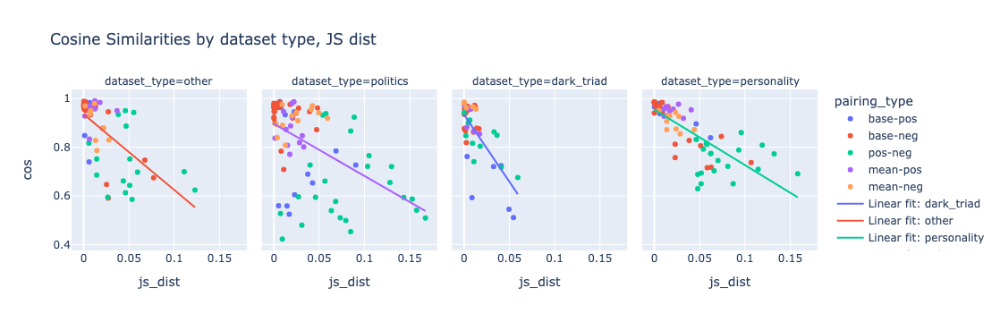



Cosine Similarities by dataset type, probability delta
Spearman's Correlation for dark_triad: -0.6303237922982038
Spearman's Correlation for other: -0.7831777271180501
Spearman's Correlation for personality: -0.8899194842785919
Spearman's Correlation for politics: -0.7006721248134369


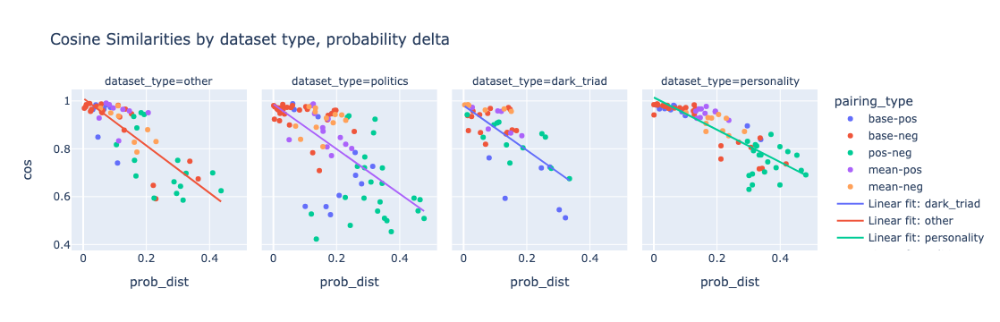



Cosine Similarities by dataset type, logit delta
Spearman's Correlation for dark_triad: -0.5259725290247553
Spearman's Correlation for other: -0.7172390808008199
Spearman's Correlation for personality: -0.9226961082919222
Spearman's Correlation for politics: -0.6761661341232232


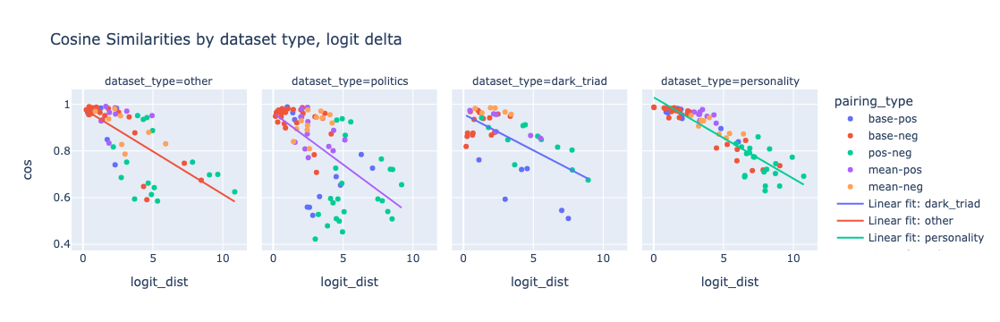



Cosine Similarities by dataset type, SYS prompt only, probability delta
Spearman's Correlation for dark_triad: -0.48571428571428577
Spearman's Correlation for other: -0.8333333333333335
Spearman's Correlation for personality: -0.8060606060606059
Spearman's Correlation for politics: -0.5384615384615385


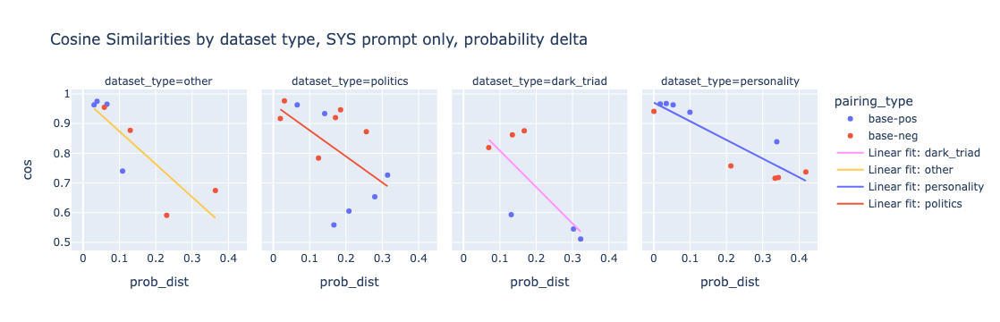



Cosine Similarities by dataset type, SYS prompt only, logit delta
Spearman's Correlation for dark_triad: -0.7714285714285715
Spearman's Correlation for other: -0.8333333333333335
Spearman's Correlation for personality: -0.9393939393939393
Spearman's Correlation for politics: -0.6013986013986015


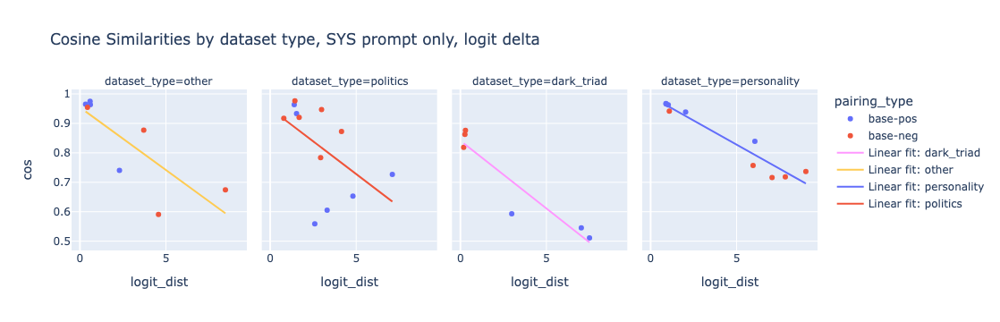

In [69]:
import plotly.express as px
from scipy import stats
import numpy as np


def plot_cos_grouped(df, facet_col, dist_col, title=None, show_fit_line: bool = True):
    fig = px.scatter(df, x=dist_col, y="cos", color="pairing_type", facet_col=facet_col, hover_data=["dataset", "prompts_type"], title=title)
    
    grouped = df.groupby(facet_col)
    facet_names = df[facet_col].unique()
    name_to_col = {name: i + 1 for i, name in enumerate(facet_names)}
    
    for name, group in grouped:
        slope, intercept = np.polyfit(group[dist_col], group['cos'], 1)
        spearman_corr, _ = stats.spearmanr(group[dist_col], group['cos'])
        print(f"Spearman's Correlation for {name}: {spearman_corr}")

        if show_fit_line:
            # Add the linear fit line to the appropriate subplot
            fig.add_scatter(x=group[dist_col], y=slope * group[dist_col] + intercept, 
                            mode='lines', name=f'Linear fit: {name}',
                            row=1, col=name_to_col[name])
    fig.show()

print("Cosine Similarities by dataset type, JS dist")
plot_cos_grouped(df, "dataset_type", "js_dist", title="Cosine Similarities by dataset type, JS dist")
print("\n")
print("Cosine Similarities by dataset type, probability delta")
plot_cos_grouped(df, "dataset_type", "prob_dist", title="Cosine Similarities by dataset type, probability delta")
print("\n")
print("Cosine Similarities by dataset type, logit delta")
plot_cos_grouped(df, "dataset_type", "logit_dist", title="Cosine Similarities by dataset type, logit delta")
print("\n")
print("Cosine Similarities by dataset type, SYS prompt only, probability delta")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "dataset_type", "prob_dist", title="Cosine Similarities by dataset type, SYS prompt only, probability delta")
print("\n")
print("Cosine Similarities by dataset type, SYS prompt only, logit delta")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "dataset_type", "logit_dist", title="Cosine Similarities by dataset type, SYS prompt only, logit delta")


## Cos sim for persona-in-system-message datasets only

We try putting the persona in both the prompt (PT_) and the system message (SYS_). Here, we filter out any datapoints involving the prompt, and look only at steering vectors from editing the system message.

Cosine Similarities by dataset type, system message only (SYS), JS dist
Spearman's Correlation for overall: -0.6826694138597287


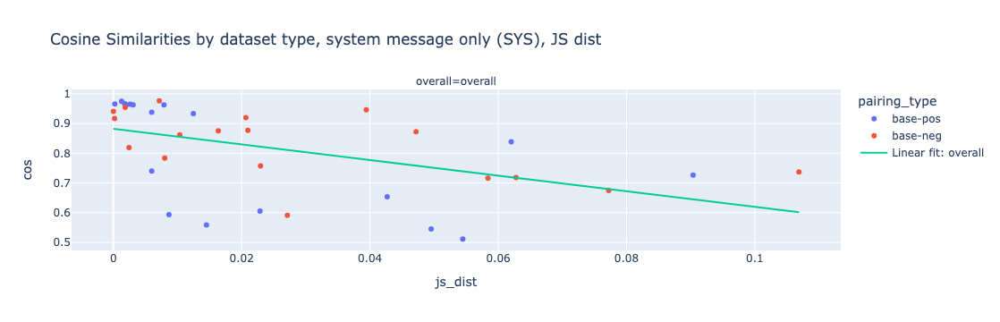



Cosine Similarities by dataset type, system message only (SYS), probability delta
Spearman's Correlation for overall: -0.7499839130016288


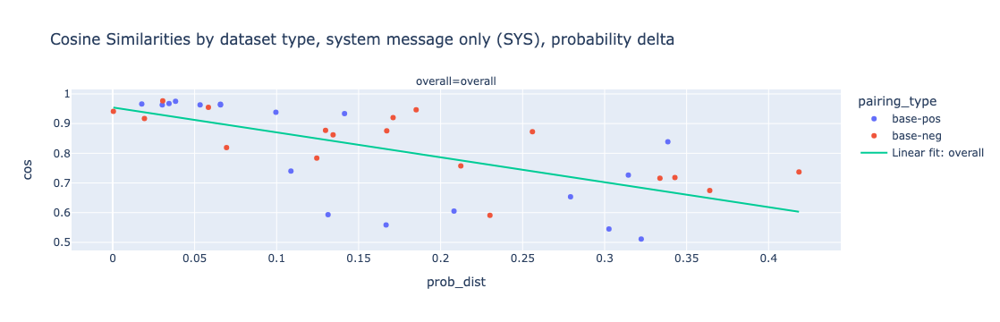



Cosine Similarities by dataset type, system message only (SYS), logit delta
Spearman's Correlation for overall: -0.6847287484415077


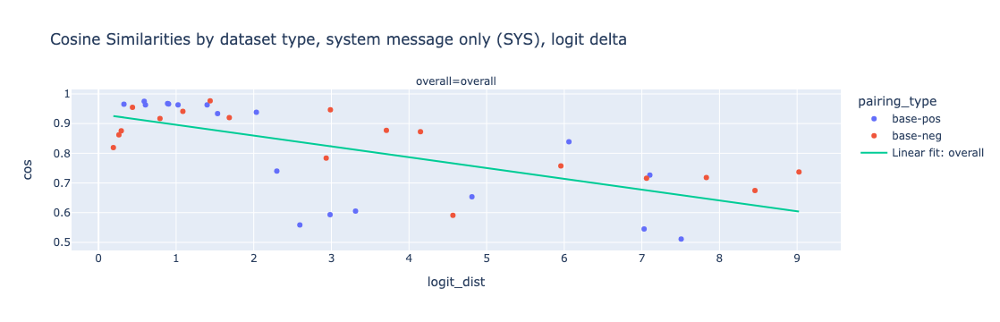



Cosine Similarities by dataset type, system message only (SYS), JS dist
Spearman's Correlation for dark_triad: -0.48571428571428577
Spearman's Correlation for other: -0.880952380952381
Spearman's Correlation for personality: -0.8060606060606059
Spearman's Correlation for politics: -0.46153846153846156


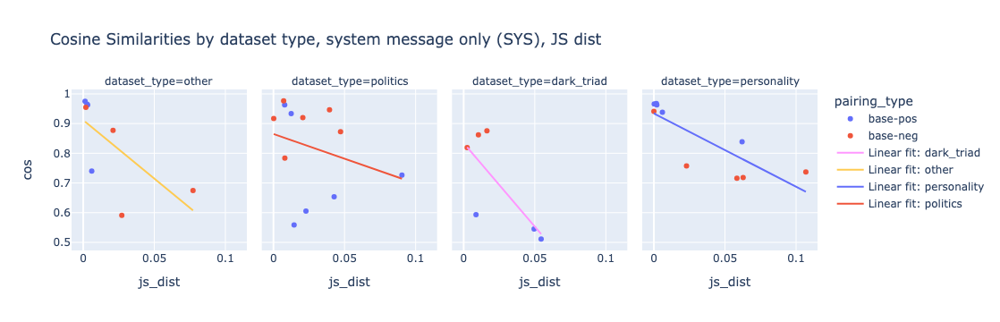



Cosine Similarities by dataset type, system message only (SYS), probability delta
Spearman's Correlation for dark_triad: -0.48571428571428577
Spearman's Correlation for other: -0.8333333333333335
Spearman's Correlation for personality: -0.8060606060606059
Spearman's Correlation for politics: -0.5384615384615385


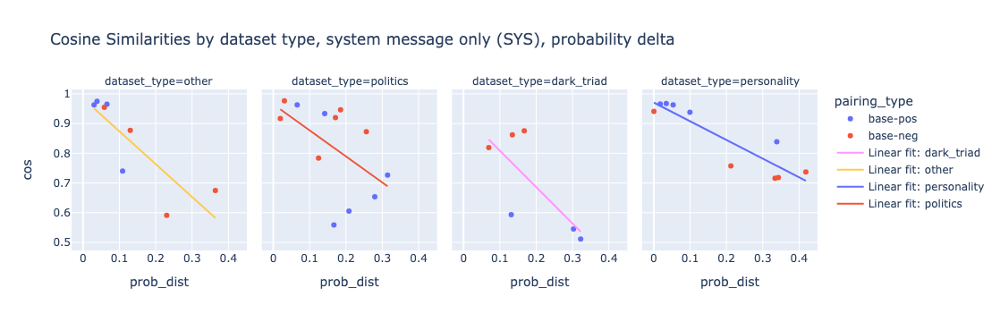



Cosine Similarities by dataset type, system message only (SYS), logit delta
Spearman's Correlation for dark_triad: -0.7714285714285715
Spearman's Correlation for other: -0.8333333333333335
Spearman's Correlation for personality: -0.9393939393939393
Spearman's Correlation for politics: -0.6013986013986015


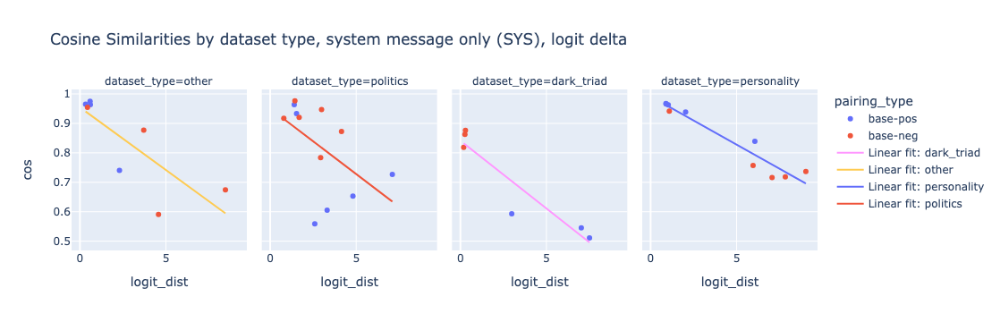

In [70]:
print("Cosine Similarities by dataset type, system message only (SYS), JS dist")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "overall", "js_dist", title="Cosine Similarities by dataset type, system message only (SYS), JS dist")
print("\n")
print("Cosine Similarities by dataset type, system message only (SYS), probability delta")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "overall", "prob_dist", title="Cosine Similarities by dataset type, system message only (SYS), probability delta")
print("\n")
print("Cosine Similarities by dataset type, system message only (SYS), logit delta")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "overall", "logit_dist", title="Cosine Similarities by dataset type, system message only (SYS), logit delta")

print("\n")

print("Cosine Similarities by dataset type, system message only (SYS), JS dist")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "dataset_type", "js_dist", title="Cosine Similarities by dataset type, system message only (SYS), JS dist")
print("\n")
print("Cosine Similarities by dataset type, system message only (SYS), probability delta")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "dataset_type", "prob_dist", title="Cosine Similarities by dataset type, system message only (SYS), probability delta")
print("\n")
print("Cosine Similarities by dataset type, system message only (SYS), logit delta")
plot_cos_grouped(df[df["prompts_type"] == "base-sys"], "dataset_type", "logit_dist", title="Cosine Similarities by dataset type, system message only (SYS), logit delta")

## Cos sim for persona-in-prompt datasets only

We try putting the persona in both the prompt (PT_) and the system message (SYS_). Here, we filter out any datapoints involving the system message, and look only at steering vectors from editing the prompt.

Cosine Similarities by dataset type, prompt only (PT), JS dist
Spearman's Correlation for overall: -0.5912291895146107


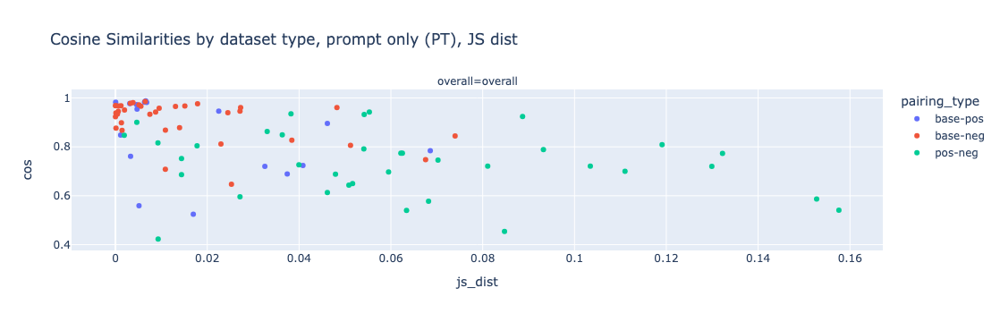



Cosine Similarities by dataset type, prompt only (PT), probability delta
Spearman's Correlation for overall: -0.6917045666478161


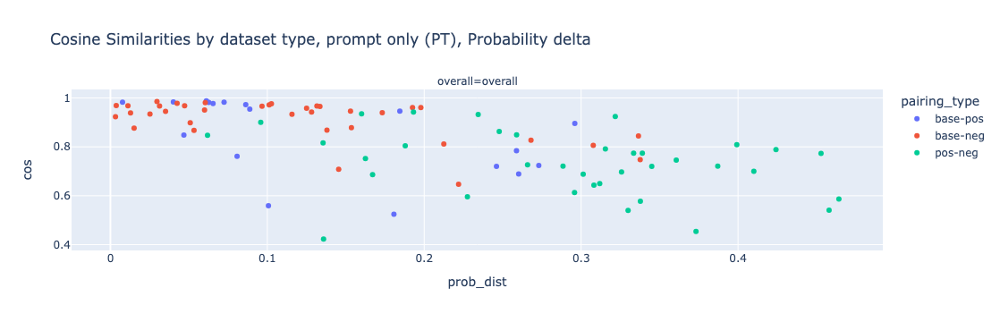



Cosine Similarities by dataset type, prompt only (PT), logit delta
Spearman's Correlation for overall: -0.6499290022572691


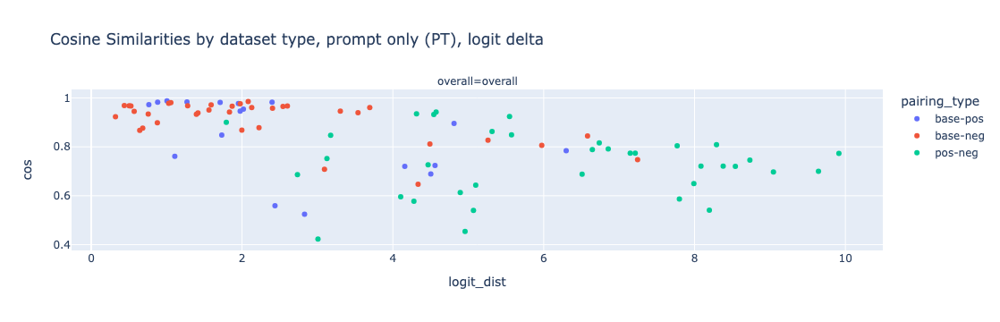



Cosine Similarities by dataset type, prompt only (PT), JS dist
Spearman's Correlation for dark_triad: -0.6
Spearman's Correlation for other: -0.6345864661654135
Spearman's Correlation for personality: -0.8115384615384615
Spearman's Correlation for politics: -0.44560622914349274


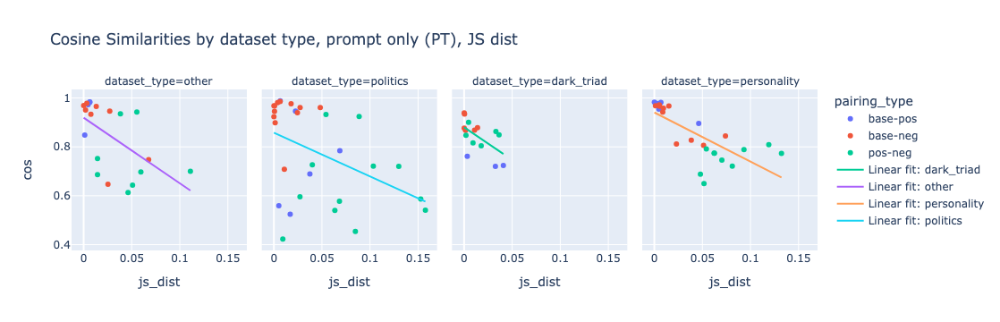



Cosine Similarities by dataset type, prompt only (PT), probability delta
Spearman's Correlation for dark_triad: -0.6
Spearman's Correlation for other: -0.806015037593985
Spearman's Correlation for personality: -0.8392307692307692
Spearman's Correlation for politics: -0.5875417130144606


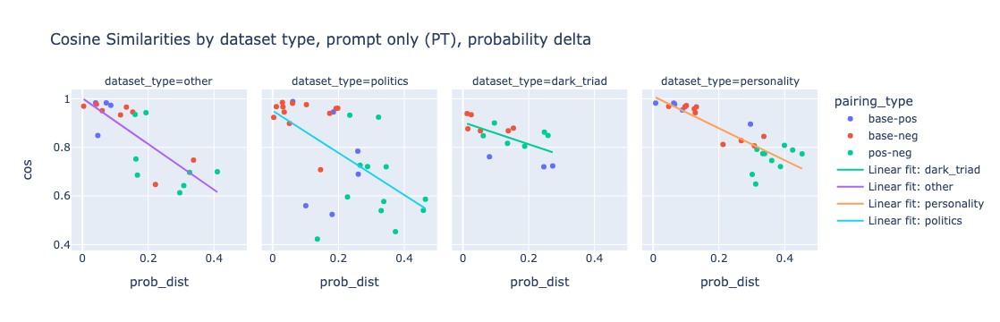



Cosine Similarities by dataset type, prompt only (PT), logit delta
Spearman's Correlation for dark_triad: -0.5464285714285714
Spearman's Correlation for other: -0.7473684210526315
Spearman's Correlation for personality: -0.8884615384615385
Spearman's Correlation for politics: -0.5630700778642936


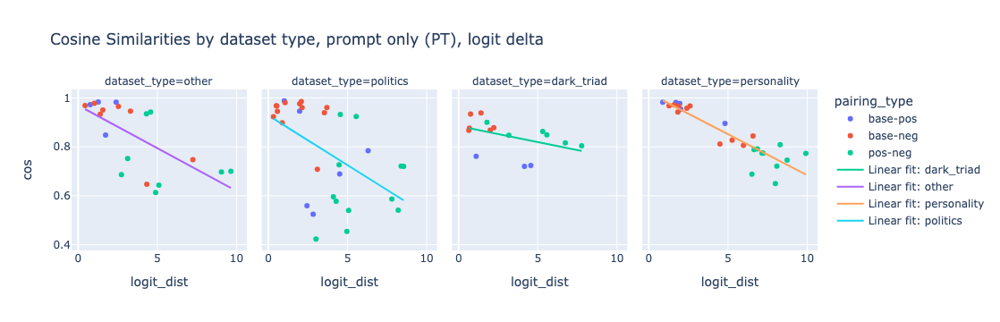

In [71]:
print("Cosine Similarities by dataset type, prompt only (PT), JS dist")
plot_cos_grouped(df[df["prompts_type"] == "base-pt"], "overall", "js_dist", show_fit_line=False, title="Cosine Similarities by dataset type, prompt only (PT), JS dist")
print("\n")
print("Cosine Similarities by dataset type, prompt only (PT), probability delta")
plot_cos_grouped(df[df["prompts_type"] == "base-pt"], "overall", "prob_dist", show_fit_line=False, title="Cosine Similarities by dataset type, prompt only (PT), Probability delta")
print("\n")
print("Cosine Similarities by dataset type, prompt only (PT), logit delta")
plot_cos_grouped(df[df["prompts_type"] == "base-pt"], "overall", "logit_dist", show_fit_line=False, title="Cosine Similarities by dataset type, prompt only (PT), logit delta")
print("\n")

print("Cosine Similarities by dataset type, prompt only (PT), JS dist")
plot_cos_grouped(df[df["prompts_type"] == "base-pt"], "dataset_type", "js_dist", title="Cosine Similarities by dataset type, prompt only (PT), JS dist")
print("\n")
print("Cosine Similarities by dataset type, prompt only (PT), probability delta")
plot_cos_grouped(df[df["prompts_type"] == "base-pt"], "dataset_type", "prob_dist", title="Cosine Similarities by dataset type, prompt only (PT), probability delta")
print("\n")
print("Cosine Similarities by dataset type, prompt only (PT), logit delta")
plot_cos_grouped(df[df["prompts_type"] == "base-pt"], "dataset_type", "logit_dist", title="Cosine Similarities by dataset type, prompt only (PT), logit delta")

# Investigating cross-steering generalization



In [21]:
import pandas as pd
from repepo.utils.stats import bernoulli_js_dist
from repepo.experiments.persona_generalization import DARK_TRIAD_PERSONAS, PERSONALITY_PERSONAS, POLITICS_PERSONAS, base_dataset_position
from typing import Literal


def steering_score(neg_prob: float, base_prob: float, pos_prob: float, dist_metric: Literal["raw", "js"]) -> float:
    neg_score = bernoulli_js_dist(base_prob, neg_prob) if dist_metric == "js" else neg_prob
    pos_score = bernoulli_js_dist(base_prob, pos_prob) if dist_metric == "js" else pos_prob
    score = pos_score - neg_score
    return score


def build_cross_steering_df(experiment_results):
    rows = []
    for dataset, result in experiment_results.items():
        layer = list(list(result.steering_vectors.values())[0].layer_activations.keys())[0]
        cs = result.cross_steering_result
        for ds_index, ds_name in enumerate(cs.dataset_labels):
            for sv_index, sv_name in enumerate(cs.steering_labels):
                neg_prob = cs.neg_steering[ds_index][sv_index].mean
                pos_prob = cs.pos_steering[ds_index][sv_index].mean
                base_prob = cs.dataset_baseline[ds_index].mean
                dataset_type = "other"
                if dataset in DARK_TRIAD_PERSONAS:
                    dataset_type = "dark_triad"
                elif dataset in PERSONALITY_PERSONAS:
                    dataset_type = "personality"
                elif dataset in POLITICS_PERSONAS:
                    dataset_type = "politics"
                base_pos = base_dataset_position(result, "raw")
                base_pos_js = base_dataset_position(result, "js")
                rel_base_pos = base_pos
                rel_base_pos_js = base_pos_js
                if ds_name == "baseline":
                    rel_base_pos = 1.0
                    rel_base_pos_js = 1.0
                elif "neg" in ds_name:
                    rel_base_pos = 1.0 - base_pos
                    rel_base_pos_js = 1.0 - base_pos_js
                    
                    
                rows.append({
                    "dataset": dataset,
                    "steering_vec": sv_name,
                    "test_variation": ds_name,
                    "neg_prob": neg_prob,
                    "base_prob": base_prob,
                    "pos_prob": pos_prob,
                    "steerability": steering_score(neg_prob, base_prob, pos_prob, "raw"),
                    "steerability_js": steering_score(neg_prob, base_prob, pos_prob, "js"),
                    "base_pos": base_pos,
                    "base_pos_js": base_pos_js,
                    "rel_base_pos": rel_base_pos,
                    "rel_base_pos_js": rel_base_pos_js,
                    "dataset_type": dataset_type,
                })
    return pd.DataFrame.from_records(rows)

cs_df = build_cross_steering_df(experiment_results)
cs_df

,dataset,steering_vec,test_variation,neg_prob,base_prob,pos_prob,steerability,steerability_js,base_pos,base_pos_js,rel_base_pos,rel_base_pos_js,dataset_type
0,interest-in-math,baseline,baseline,0.666806,0.845082,0.893996,0.227189,0.024578,0.953683,0.995998,1.000000,1.000000,other
1,interest-in-math,SYS_positive,baseline,0.662231,0.845082,0.898554,0.236323,0.026156,0.953683,0.995998,1.000000,1.000000,other
2,interest-in-math,PT_positive,baseline,0.667400,0.845082,0.896372,0.228972,0.024737,0.953683,0.995998,1.000000,1.000000,other
3,interest-in-math,SYS_negative,baseline,0.779743,0.845082,0.871490,0.091748,0.004234,0.953683,0.995998,1.000000,1.000000,other
4,interest-in-math,PT_negative,baseline,0.722240,0.845082,0.881823,0.159583,0.012684,0.953683,0.995998,1.000000,1.000000,other
...,...,...,...,...,...,...,...,...,...,...,...,...,...
445,anti-LGBTQ-rights,baseline,PT_negative,0.002870,0.004693,0.020041,0.017171,0.002705,0.095056,0.079076,0.904944,0.920924,politics
446,anti-LGBTQ-rights,SYS_positive,PT_negative,0.004483,0.004693,0.008759,0.004276,0.000315,0.095056,0.079076,0.904944,0.920924,politics
447,anti-LGBTQ-rights,PT_positive,PT_negative,0.003785,0.004693,0.011925,0.008139,0.000845,0.095056,0.079076,0.904944,0.920924,politics
448,anti-LGBTQ-rights,SYS_negative,PT_negative,0.002678,0.004693,0.021877,0.019199,0.003192,0.095056,0.079076,0.904944,0.920924,politics


In [33]:
import plotly.express as px
from scipy import stats
import numpy as np


def plot_cross_steering_grouped(df, x, y, facet_col, title=None, show_fit_line: bool = True):
    fig = px.scatter(df, x=x, y=y, color="test_variation", facet_col=facet_col, hover_data=["dataset"], title=title)
    
    grouped = df.groupby(facet_col)
    facet_names = df[facet_col].unique()
    name_to_col = {name: i + 1 for i, name in enumerate(facet_names)}
    
    for name, group in grouped:
        slope, intercept = np.polyfit(group[x], group[y], 1)
        spearman_corr, _ = stats.spearmanr(group[x], group[y])
        print(f"Spearman's Correlation for {name}: {spearman_corr}")

        if show_fit_line:
            # Add the linear fit line to the appropriate subplot
            fig.add_scatter(x=group[x], y=slope * group[x] + intercept, 
                            mode='lines', name=f'Linear fit: {name}',
                            row=1, col=name_to_col[name])
    fig.show()

## How well does a steering vector trained on the base dataset steer persona variations?

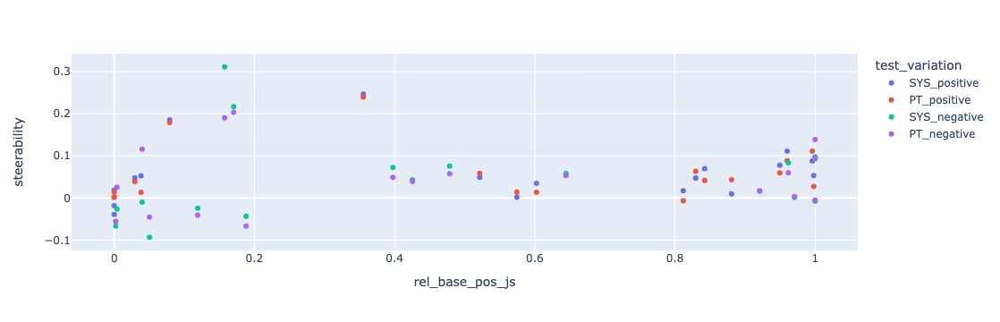

In [38]:
base_sv_df = cs_df[(cs_df["steering_vec"] == "baseline") & (cs_df["test_variation"] != "baseline")]

px.scatter(base_sv_df, x="rel_base_pos_js", y="steerability", color="test_variation", hover_data=["dataset"])

In [47]:
torch.log(torch.tensor(2))

tensor(0.6931)

In [44]:
bernoulli_js_dist(1, 0)

-0.6931470632553101

Spearman's Correlation for dark_triad: 0.4828045495852676
Spearman's Correlation for other: 0.43787748820631456
Spearman's Correlation for personality: 0.552456763679106
Spearman's Correlation for politics: -0.442896022325409


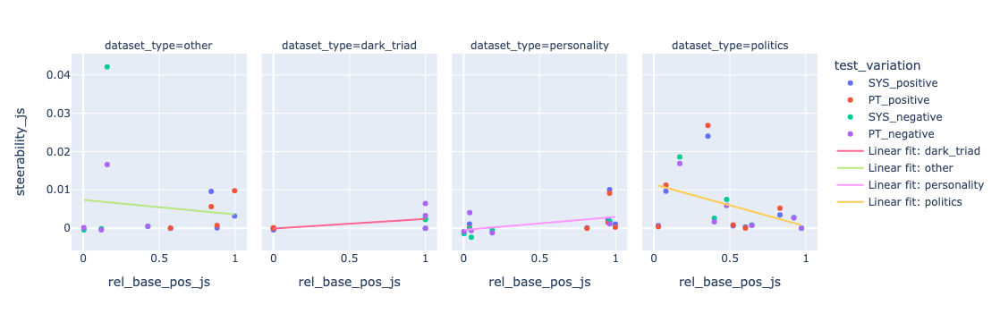

In [49]:
plot_cross_steering_grouped(base_sv_df, x="rel_base_pos_js", y="steerability_js", facet_col="dataset_type")

In [40]:
base_sv_df[base_sv_df["dataset"] == "anti-LGBTQ-rights"]

,dataset,steering_vec,test_variation,neg_prob,base_prob,pos_prob,steerability,steerability_js,base_pos,base_pos_js,rel_base_pos,rel_base_pos_js,dataset_type
430,anti-LGBTQ-rights,baseline,SYS_positive,0.254948,0.348825,0.440350,0.185402,0.009634,0.095056,0.079076,0.095056,0.079076,politics
435,anti-LGBTQ-rights,baseline,PT_positive,0.181262,0.293159,0.359893,0.178632,0.011249,0.095056,0.079076,0.095056,0.079076,politics
440,anti-LGBTQ-rights,baseline,SYS_negative,0.002461,0.003800,0.018533,0.016072,0.002746,0.095056,0.079076,0.904944,0.920924,politics
445,anti-LGBTQ-rights,baseline,PT_negative,0.002870,0.004693,0.020041,0.017171,0.002705,0.095056,0.079076,0.904944,0.920924,politics
